# Stations Sensirion
**Purpose:** Analyze the *results*, *random error*, and *systematic error* for the Sensirion sensors used during measurement of air pollution on the Stockholm subway platforms.

### Structure

**Results**

* What is the mean air pollution for each station?
* What is the difference between morning and afternoon?
* Compare during rush hour and off-hour
* How does these values relate to the WHO Guidelines?
* General statistics of measuring time

**Random error**

* Look at distributions
* Look at standard deviations
* Anova

**Systematic error**

* Drift
* How much systematic error would we need to have for an "acceptable value" to be what we observe?


## Setup

In [1]:
################################
# LIBRARIES
################################
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from src.util import *
from src.frames import *
from src.stats import *
from src.plots import *

import numpy as np
import pandas as pd
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import json

%matplotlib inline
%load_ext autoreload
%autoreload 2

pd.options.mode.chained_assignment = None  # default='warn'

/opt/homebrew/lib/python3.9/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [141]:
# Read Session df, and raw session df
s_df = pd.read_csv('../results/sessions/sensirion.csv')
r_df = pd.read_csv('../results/sessions/sensirion_raw.csv')

# Convert sensor column to string
r_df['Sensor'] = r_df['Sensor'].astype(str)

# Only keep stations from the green line
s_df = s_df[s_df['Station'].isin(get_green_line())]
r_df = r_df[r_df['Station'].isin(get_green_line())]

# Sort by green line
green_line_order = CategoricalDtype(get_green_line(), ordered=True)

s_df['Station Order'] = s_df['Station'].astype(green_line_order)
r_df['Station Order'] = r_df['Station'].astype(green_line_order)

s_df = s_df.sort_values('Station Order')
r_df = r_df.sort_values('Station Order')

# Morning and evening
def morning(x):
    return ((x > '06:00:00') & (x < '09:00:00'))
    
def evening(x):
    return ((x > '15:00:00') & (x < '18:00:00'))
    
s_df['Period'] = s_df['Time'].apply(lambda x: 'Morning rush' if morning(x) else 'Evening rush' if evening(x) else 'Offtime')

# Keep a record of station id's
session_ids = sorted(list(r_df["Session Id"].unique()))

# Choose what param to be analyzed
param = 'PM2.5'
unit = 'µg/m³'

#param = 'NC2.5'
#unit = '#/cm³'

# PM 'µg/m³'
# NC '#/cm³'

# figure folder
fig_folder = '../results/stations_sensirion'

## Overview Statistics

### Number of sessions

**Key stats:**

Total sessions: 38

Most sessions: Odenplan, 27

Least sessions: Ängbyplan, 2

In [3]:
### Sessions per station
def total_count(x):
    return len(x)

def morning_rush_count(x):
    return x.value_counts()['Morning rush']

def evening_rush_count(x):
    return x.value_counts()['Evening rush']

def offtime_count(x):
    if 'Offtime' not in x.values:
        return 0
        
    return x.value_counts()['Offtime']

session_count = s_df.groupby('Station').agg({'Period': [total_count, morning_rush_count, evening_rush_count, offtime_count]})

print(f'Total unique sessions: {len(s_df["Session Id"].unique())}')

session_count = session_count['Period'].sort_values(by='total_count', ascending=False)
session_count.loc['Total'] = session_count.sum()

session_count.to_csv(f'{fig_folder}/tables/session_counts({param}).csv')

session_count


Total unique sessions: 38


,total_count,morning_rush_count,evening_rush_count,offtime_count
Station,,,,
Odenplan,27,12,9,6
St Eriksplan,20,8,8,4
Fridhemsplan,20,8,8,4
Kristineberg,20,8,7,5
Alvik,20,8,7,5
Slussen,18,9,5,4
Medborgarplatsen,17,9,5,3
Thorildsplan,17,6,6,5
T-Centralen,17,8,5,4


### Measurement time

**Key statistics**

Total unique measuring time: 24h 41m 34s

Total measuring time across sensors: 119h 22m 57s

Station sensor measuring time: 42h 58m 40s 

Unique station sensor measuring time: 7h 55m 24s

In [4]:
def convert_second_time(seconds):
    m, s = divmod(seconds, 60)
    h, m = divmod(m, 60)
    
    return f'{h:d}h {m:02d}m {s:02d}s'
    

In [5]:
### Total measuring time
m_df = pd.read_csv('../results/measurement_time.csv')

total_seconds = int(m_df['Seconds'].sum())
print(f'Total sensor time: {convert_second_time(total_seconds)}')

m_df['h:m:s'] = m_df['Seconds'].apply(convert_second_time)

m_df.to_csv(f'{fig_folder}/tables/measuring_time_per_sensor({param}).csv')

m_df.sort_values(by=['Sensor'])

Total sensor time: 119h 22m 57s


,Sensor,Seconds,h:m:s
3,1,56602,15h 43m 22s
0,2,83408,23h 10m 08s
4,3,51184,14h 13m 04s
1,4,43440,12h 04m 00s
5,5,33260,9h 14m 20s
6,6,16875,4h 41m 15s
7,A,18212,5h 03m 32s
2,B,58711,16h 18m 31s
8,C,21782,6h 03m 02s
9,D,23331,6h 28m 51s


**Unique measuring time**

In [6]:
### Unique measuring time
m_df = pd.read_csv('../results/measurement_researcher_time.csv')

total_seconds = int(m_df['Seconds'].sum())
print(f'Total unique sensor time: {convert_second_time(total_seconds)}')

m_df['h:m:s'] = m_df['Seconds'].apply(convert_second_time)

m_df.to_csv(f'{fig_folder}/tables/measuring_time_per_session({param}).csv')

m_df.sort_values(by=['Date'])

Total unique sensor time: 24h 41m 34s


,Date,Seconds,h:m:s
4,2021-09-22,1777,0h 29m 37s
6,2021-09-23,3955,1h 05m 55s
5,2021-09-24,4356,1h 12m 36s
14,2021-09-27,8558,2h 22m 38s
13,2021-09-28,8904,2h 28m 24s
15,2021-09-29,6071,1h 41m 11s
0,2021-09-30,6917,1h 55m 17s
9,2021-10-01,8042,2h 14m 02s
2,2021-10-04,4751,1h 19m 11s
1,2021-10-05,9168,2h 32m 48s


**Measuring time per station**

In [7]:
station_times = {}

for station, station_grp in r_df.groupby('Station'):
    for session_id, session_grp in station_grp.groupby('Session Id'):
        if station not in station_times:
            station_times[station] = []
            
        station_times[station].append(len(session_grp))

total_times = {s: sum(v) for s, v in station_times.items()}
total_time_df = pd.DataFrame(total_times.items(), columns=["Station", "Seconds"])

total_seconds = int(total_time_df['Seconds'].sum())
print(f'Total station measuring time: {convert_second_time(total_seconds)}')

total_time_df['h:m:s'] = total_time_df['Seconds'].apply(convert_second_time)

total_time_df.to_csv(f'{fig_folder}/tables/total_time({param}).csv')

total_time_df.sort_values(by=['Seconds'], ascending=False)

Total station measuring time: 42h 58m 40s


,Station,Seconds,h:m:s
11,Odenplan,29848,8h 17m 28s
10,Medborgarplatsen,8868,2h 27m 48s
1,Alvik,8742,2h 25m 42s
4,Fridhemsplan,8493,2h 21m 33s
9,Kristineberg,8258,2h 17m 38s
3,Brommaplan,8254,2h 17m 34s
5,Gamla Stan,7781,2h 09m 41s
13,Skanstull,7646,2h 07m 26s
17,T-Centralen,7557,2h 05m 57s
12,Rådmansgatan,7284,2h 01m 24s


In [8]:
unique_times = {s: max(v) for s, v in station_times.items()}
unique_time_df = pd.DataFrame(unique_times.items(), columns=["Station", "Seconds"])

total_seconds = int(unique_time_df['Seconds'].sum())
print(f'Total unique station sensor time: {convert_second_time(total_seconds)}')

unique_time_df['h:m:s'] = unique_time_df['Seconds'].apply(convert_second_time)

unique_time_df.to_csv(f'{fig_folder}/tables/unique_times({param}).csv')

unique_time_df.sort_values(by=['Seconds'], ascending=False)

Total unique station sensor time: 7h 55m 24s


,Station,Seconds,h:m:s
11,Odenplan,8182,2h 16m 22s
19,Åkeshov,2155,0h 35m 55s
3,Brommaplan,1921,0h 32m 01s
5,Gamla Stan,1470,0h 24m 30s
1,Alvik,1457,0h 24m 17s
16,Stora mossen,1172,0h 19m 32s
12,Rådmansgatan,1156,0h 19m 16s
18,Thorildsplan,1098,0h 18m 18s
17,T-Centralen,1050,0h 17m 30s
13,Skanstull,1020,0h 17m 00s


#### Latex formatting

In [360]:
t = total_time_df.copy()
s = session_count.copy()
#s['Station'] = session_count.index
s.reset_index(inplace=True)

s = s[['Station', 'total_count']]

t = t[['Station', 'h:m:s']]

stats = pd.merge(s, t, on='Station')
green_line_order = CategoricalDtype(get_green_line(), ordered=True)

stats['order'] = stats['Station'].astype(green_line_order)
stats = stats.sort_values('order')

for index, row in stats.iterrows():
    print(f'{row[0]} & {row[1]} & {row[2]} \\\\')
   

Islandstorget & 4 & 0h 15m 04s \\
Angbyplan & 2 & 0h 09m 31s \\
Åkeshov & 9 & 2h 00m 07s \\
Brommaplan & 11 & 2h 17m 34s \\
Abrahamsberg & 11 & 1h 14m 53s \\
Stora mossen & 11 & 1h 29m 38s \\
Alvik & 20 & 2h 25m 42s \\
Kristineberg & 20 & 2h 17m 38s \\
Thorildsplan & 17 & 1h 50m 54s \\
Fridhemsplan & 20 & 2h 21m 33s \\
St Eriksplan & 20 & 1h 58m 08s \\
Odenplan & 27 & 8h 17m 28s \\
Rådmansgatan & 17 & 2h 01m 24s \\
Hötorget & 16 & 1h 53m 29s \\
T-Centralen & 17 & 2h 05m 57s \\
Gamla Stan & 17 & 2h 09m 41s \\
Slussen & 18 & 1h 55m 55s \\
Medborgarplatsen & 17 & 2h 27m 48s \\
Skanstull & 17 & 2h 07m 26s \\
Gullmarsplan & 16 & 1h 38m 50s \\


In [ ]:
# Average measuring time per session per station

In [499]:
def timestamp_diff(x):
    FMT = "%Y-%m-%d %H:%M:%S"
    return datetime.strptime(x.max(), FMT) - datetime.strptime(x.min(), FMT)


session_time_df = r_df.groupby('Session Id').agg({'Timestamp': ['min', 'max']})

station_session_times = {}

for station, grp in r_df.groupby('Station'):
    
    station_times = []
    
    for session_id, grp2 in grp.groupby('Session Id'):
        station_times.append(timestamp_diff(grp2['Timestamp']))
    
    station_times = np.array(station_times)
    
    station_session_times[station] = station_times.mean()

station_times_df = pd.DataFrame(station_session_times.items(), columns=["Station", "Time"])

# Exclude islandstorget and angbyplan

station_times_df.loc['Mean'] = station_times_df.mean()
station_times_df['Time'] = station_times_df['Time'].apply(lambda x: int(x / np.timedelta64(1, 's')))
station_times_df['h:m:s'] = station_times_df['Time'].apply(convert_second_time)


In [501]:
station_times_df.sort_values(by=['Time'], ascending=False)

,Station,Time,h:m:s
11,Odenplan,336,0h 05m 36s
19,Åkeshov,195,0h 03m 15s
3,Brommaplan,175,0h 02m 55s
10,Medborgarplatsen,134,0h 02m 14s
Mean,NaN,127,0h 02m 07s
5,Gamla Stan,126,0h 02m 06s
0,Abrahamsberg,122,0h 02m 02s
16,Stora mossen,120,0h 02m 00s
13,Skanstull,117,0h 01m 57s
1,Alvik,112,0h 01m 52s


## General statistics
Grand mean, median, mode, standard deviation and confidence interval

In [14]:
general_stats = s_df.groupby('Station').agg({param: ['mean', 'median', mode, 'min', 'max', x_range, sample_std, CI95, CV, standard_error]})
general_stats['order index'] = [get_green_line().index(name) for name in general_stats[param].index]

general_stats.to_csv(f'{fig_folder}/tables/general_stats({param}).csv')
general_stats.sort_values('order index')


PM2.5                                              \
                       mean     median       mode        min        max   
Station                                                                   
Islandstorget      4.976338   4.068269   1.084142   1.084142  10.684670   
Angbyplan          5.263368   5.263368   2.340394   2.340394   8.186343   
Åkeshov            3.877246   2.272186   0.947453   0.947453  10.981520   
Brommaplan         4.258307   2.175216   1.392843   1.392843  11.586208   
Abrahamsberg       4.287694   2.402954   1.115119   1.115119  11.966233   
Stora mossen       4.523714   2.435652   0.989858   0.989858  12.339645   
Alvik              4.467509   2.750288   1.138451   1.138451  14.547572   
Kristineberg       4.877085   3.366950   1.375542   1.375542  14.172791   
Thorildsplan       4.590125   2.749859   1.145521   1.145521  14.647840   
Fridhemsplan      18.498708  18.579926   9.970356   9.970356  32.515526   
St Eriksplan      24.752078  25.670607  15.858534  15.858534  28.757158   
Odenplan          27.472746  28.001839  18.894177  18.894177  33.231619   
Rådmansgatan      29.590381  26.780068  21.447759  21.447759  59.888621   
Hötorget          35.551594  37.631750  23.946914  23.946914  43.415000   
T-Centralen       31.267734  31.982356  19.522650  19.522650  42.133086   
Gamla Stan         8.218249   7.304916   2.837857   2.837857  15.875286   
Slussen           22.001547  21.189450   8.790738   8.790738  36.031667   
Medborgarplatsen  17.858760  18.326150  13.347791  13.347791  23.848627   
Skanstull         14.880032  13.794548   9.084726   9.084726  26.618011   
Gullmarsplan       4.459181   3.953836   0.357994   0.357994  11.160419   

                                                                           \
                    x_range sample_std      CI95        CV standard_error   
Station                                                                     
Islandstorget      9.600528   4.135132  4.052429  0.830959       2.067566   
Angbyplan          5.845948   4.133710  5.729029  0.785373       2.922974   
Åkeshov           10.034067   3.549239  2.318836  0.915402       1.183080   
Brommaplan        10.193365   3.754943  2.219029  0.881792       1.132158   
Abrahamsberg      10.851114   3.789572  2.239494  0.883825       1.142599   
Stora mossen      11.349786   3.967596  2.344699  0.877066       1.196275   
Alvik             13.409121   3.642231  1.596278  0.815271       0.814428   
Kristineberg      12.797249   3.640378  1.595466  0.746425       0.814013   
Thorildsplan      13.502319   3.611958  1.717016  0.786898       0.876029   
Fridhemsplan      22.545171   4.581664  2.008003  0.247675       1.024491   
St Eriksplan      12.898624   3.027606  1.326907  0.122317       0.676993   
Odenplan          14.337442   3.766731  1.420819  0.137108       0.724908   
Rådmansgatan      38.440862   9.556264  4.542760  0.322952       2.317735   
Hötorget          19.468086   5.503049  2.696494  0.154790       1.375762   
T-Centralen       22.610436   5.140863  2.443811  0.164414       1.246842   
Gamla Stan        13.037429   4.208918  2.000793  0.512143       1.020813   
Slussen           27.240928   8.401783  3.881426  0.381872       1.980319   
Medborgarplatsen  10.500837   2.749241  1.306906  0.153944       0.666789   
Skanstull         17.533285   4.532894  2.154801  0.304629       1.099388   
Gullmarsplan      10.802426   2.971506  1.456038  0.666379       0.742876   

                 order index  
                              
Station                       
Islandstorget              0  
Angbyplan                  1  
Åkeshov                    2  
Brommaplan                 3  
Abrahamsberg               4  
Stora mossen               5  
Alvik                      6  
Kristineberg               7  
Thorildsplan               8  
Fridhemsplan               9  
St Eriksplan              10  
Odenplan                  11  
Rådmansgatan              12  
Hötorget                  13

In [17]:
general_stats[param].sort_values('mean', ascending=False)

,mean,median,mode,min,max,x_range,sample_std,CI95,CV,standard_error
Station,,,,,,,,,,
Hötorget,35.551594,37.631750,23.946914,23.946914,43.415000,19.468086,5.503049,2.696494,0.154790,1.375762
T-Centralen,31.267734,31.982356,19.522650,19.522650,42.133086,22.610436,5.140863,2.443811,0.164414,1.246842
Rådmansgatan,29.590381,26.780068,21.447759,21.447759,59.888621,38.440862,9.556264,4.542760,0.322952,2.317735
Odenplan,27.472746,28.001839,18.894177,18.894177,33.231619,14.337442,3.766731,1.420819,0.137108,0.724908
St Eriksplan,24.752078,25.670607,15.858534,15.858534,28.757158,12.898624,3.027606,1.326907,0.122317,0.676993
Slussen,22.001547,21.189450,8.790738,8.790738,36.031667,27.240928,8.401783,3.881426,0.381872,1.980319
Fridhemsplan,18.498708,18.579926,9.970356,9.970356,32.515526,22.545171,4.581664,2.008003,0.247675,1.024491
Medborgarplatsen,17.858760,18.326150,13.347791,13.347791,23.848627,10.500837,2.749241,1.306906,0.153944,0.666789
Skanstull,14.880032,13.794548,9.084726,9.084726,26.618011,17.533285,4.532894,2.154801,0.304629,1.099388


## Distribution

### Box Plot 1

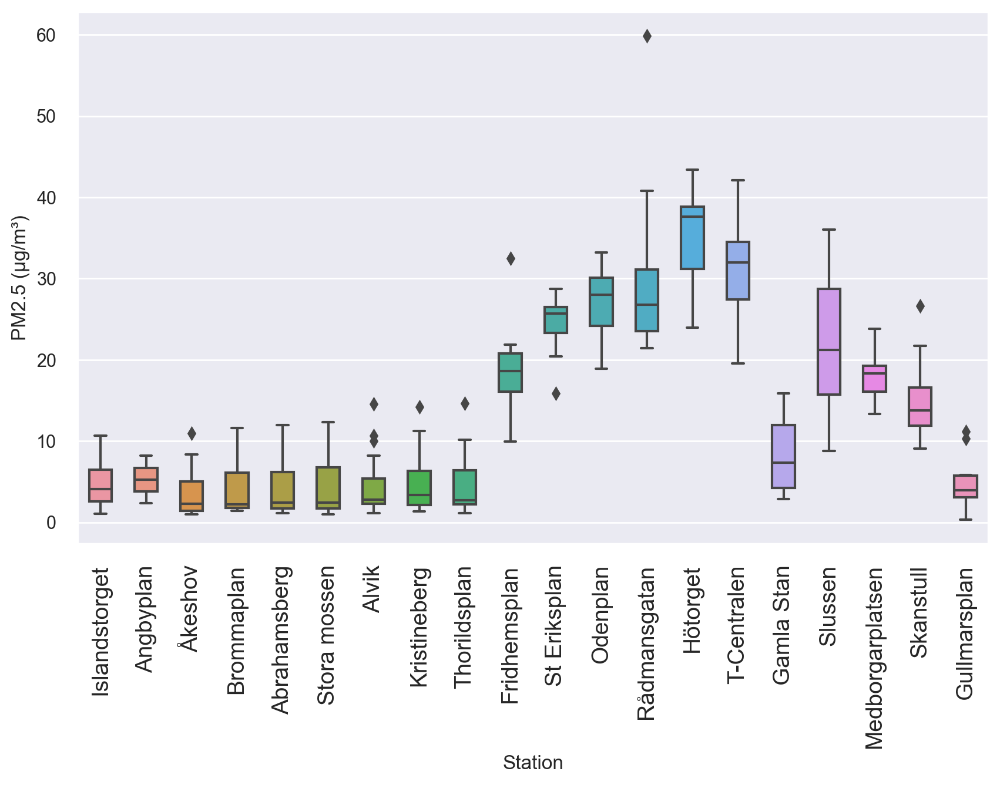

In [8]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

sns.boxplot(x='Station', y=param, data=s_df, width=0.5, order=get_green_line())
plt.xticks(rotation=90, fontsize=14)
ax.set_xlabel('Station')
ax.set_ylabel(f'{param} ({unit})')
#plt.title('Box Plots Stations')
plt.savefig(f'{fig_folder}/box_plots({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

In [ ]:
s_df.groupby('Station').agg({'PM2.5'})

### Box plot with lines

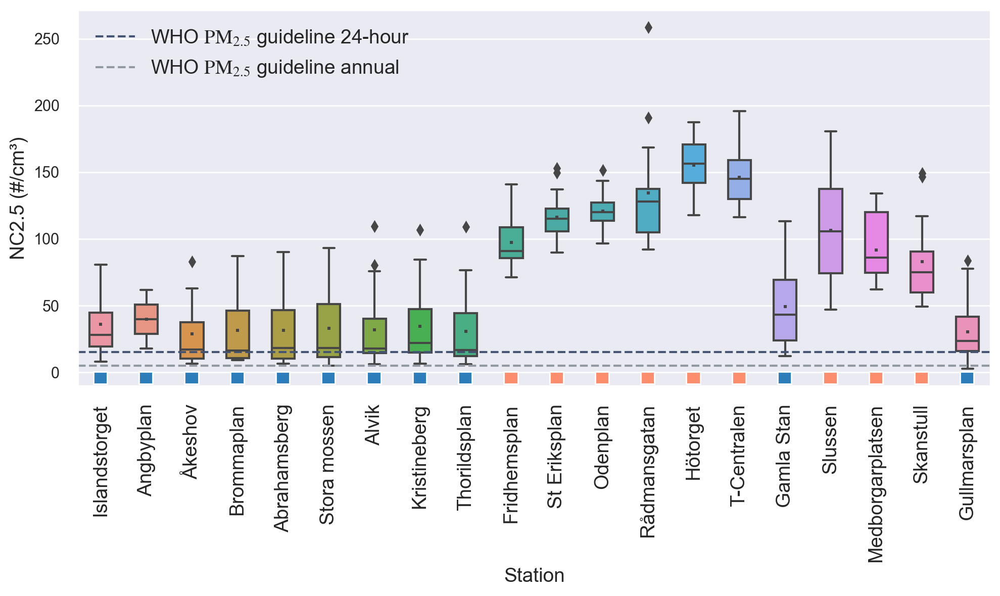

In [130]:
from matplotlib import patches, pyplot

fig, ax = plt.subplots(figsize=[10,6], dpi=200)

sns.boxplot(
    x='Station', 
    y=param, 
    data=s_df, 
    width=0.5, 
    order=get_green_line(), 
    showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    }
)

plt.axhline(15, label=r'WHO $\mathrm{PM}_{2.5}$ guideline 24-hour', c='#435573', linestyle='--')
plt.axhline(5, label=r'WHO $\mathrm{PM}_{2.5}$ guideline annual', c='#9298a1', linestyle='--')

plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Station', fontsize=14)

plt.legend(fontsize=14, loc=2)
plt.xticks(rotation=90, fontsize=14)

# Change color of xticks
inside_c = '#FC8D6D'
outside_c = '#2D7DBB'

i = 0
for t in ax.xaxis.get_ticklabels():
    
    c = inside_c if t.get_text() in get_inside_stations() else outside_c
    
    ax.text(
        i - 0.04, -4, 
        ' ',
        fontsize = 2, 
        zorder = 6, 
        color = 'k', 
        rotation=90, 
        bbox={'facecolor': c, 'pad':4}
    )
    
    i += 1
    
plt.tight_layout()
plt.savefig(f'{fig_folder}/box_plot_color({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

In [ ]:
# #CE9BE9

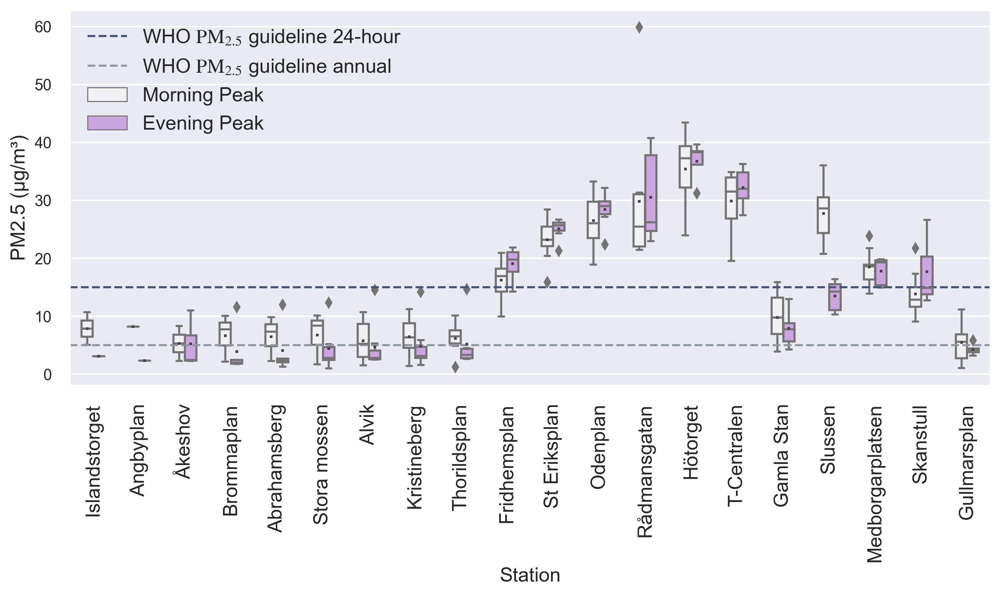

In [128]:
fig, ax = plt.subplots(figsize=[10,6], dpi=300)

plot_df = s_df.loc[s_df['Period'] != 'Offtime']
plot_df['Period'] = plot_df['Period'].apply(lambda x: 'Morning Peak' if x == 'Morning rush' else x)
plot_df['Period'] = plot_df['Period'].apply(lambda x: 'Evening Peak' if x == 'Evening rush' else x)

sns.boxplot(
    x='Station', 
    y=param, 
    data=plot_df, 
    width=0.5, 
    order=get_green_line(), 
    hue='Period',
    color='#CE9BE9',
    showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    }
)


plt.axhline(15, label=r'WHO $\mathrm{PM}_{2.5}$ guideline 24-hour', c='#435573', linestyle='--')
plt.axhline(5, label=r'WHO $\mathrm{PM}_{2.5}$ guideline annual', c='#9298a1', linestyle='--')

plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Station', fontsize=14)

plt.legend(fontsize=14, loc=2)
plt.xticks(rotation=90, fontsize=14)

plt.tight_layout()
plt.savefig(f'{fig_folder}/box_plots_slussen({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

**Comments**

Hötorget, T-Centralen, and Rådmansgatan have the highest means.

### Quantiles and outliers

In [387]:
# Compute median, lower quartile, upper quartile, IQR, lower limit and upper limit
station_quantiles = s_df.groupby('Station').agg(
    {param: 
     [Q1, Q2, Q3, IQR, lowerLimit, upperLimit, outliers, prcnt_outliers, 'count']
    }
)

station_quantiles.to_csv(f'{fig_folder}/tables/station_quantiles({param}).csv')
station_quantiles[param].sort_values(by='outliers', ascending=False)

,Q1,Q2,Q3,IQR,lowerLimit,upperLimit,outliers,prcnt_outliers,count
Station,,,,,,,,,
Alvik,2.282089,2.750288,5.375229,3.093140,-2.357621,10.014940,3.0,15.000000,20
Gullmarsplan,3.045211,3.953836,5.724037,2.678826,-0.973029,9.742276,2.0,12.500000,16
Åkeshov,1.402442,2.272186,5.020286,3.617843,-4.024322,10.447051,1.0,11.111111,9
Rådmansgatan,23.541816,26.780068,31.146869,7.605052,12.134238,42.554447,1.0,5.882353,17
Thorildsplan,2.220738,2.749859,6.397453,4.176714,-4.044333,12.662524,1.0,5.882353,17
Fridhemsplan,16.099828,18.579926,20.769398,4.669570,9.095474,27.773752,1.0,5.000000,20
St Eriksplan,23.322656,25.670607,26.500611,3.177954,18.555725,31.267542,1.0,5.000000,20
Kristineberg,2.166427,3.366950,6.345808,4.179381,-4.102644,12.614879,1.0,5.000000,20
Skanstull,11.890409,13.794548,16.566617,4.676208,4.876098,23.580929,1.0,5.882353,17


**Comment**

Some stations have outliers. What happened during these sessions?

In [388]:
outlier_ids = print_outliers(s_df, station_quantiles, param)

=== OUTLIERS ===
Alvik:
	20211006-2 - PM2.5 = 10.05
	20211011-2 - PM2.5 = 10.68
	20211004-2 - PM2.5 = 14.55

Fridhemsplan:
	20211013-1 - PM2.5 = 32.52

Gullmarsplan:
	20211011-1 - PM2.5 = 11.16
	20211006-1 - PM2.5 = 10.28

Kristineberg:
	20211004-2 - PM2.5 = 14.17

Rådmansgatan:
	20210929-1 - PM2.5 = 59.89

Skanstull:
	20210930-3 - PM2.5 = 26.62

St Eriksplan:
	20211005-2 - PM2.5 = 15.86

Thorildsplan:
	20211004-2 - PM2.5 = 14.65

Åkeshov:
	20211004-2 - PM2.5 = 10.98

Unique outliers: ['20210929-1', '20210930-3', '20211004-2', '20211005-2', '20211006-1', '20211006-2', '20211011-1', '20211011-2', '20211013-1']


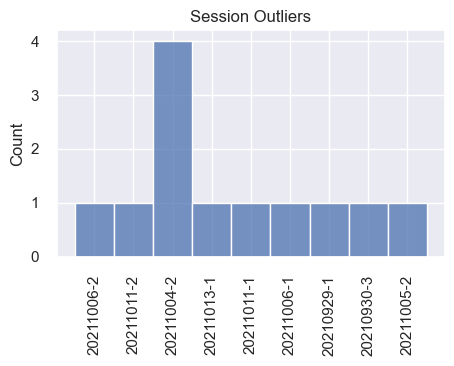

In [389]:
fig, ax = plt.subplots(figsize=[5, 3], dpi=100)

sns.histplot(outlier_ids)
plt.title('Session Outliers')
plt.xticks(rotation=90)
plt.show()

**Comment**

These sessions are worth examining and comparing with other sources. Especially session 20211004-2, as it contains 5 outliers within the same session!

**Looking at outliers 2021-10-04-2**

In [81]:
s_id = '20211001-3'

tmp1 = s_df[s_df['Session Id'] == s_id][['Station', param]]

tmp2 = s_df.groupby('Station').agg({param: 'mean'})[param][list(tmp1.Station.unique())]
tmp2 = tmp2.to_frame()

tmp2['Station'] = tmp2.index
tmp2 = tmp2.reset_index(drop=True)

tmp2 = tmp2.rename(columns={param: f'{param} Mean'})

tmp = pd.merge(tmp1, tmp2, on='Station')

tmp['Diff'] = tmp[param] - tmp[f'{param} Mean']

#print(get_middle_value(s_df[s_df['Session Id'] == s_id], 'Timestamp'))

tmp

,Station,PM2.5,PM2.5 Mean,Diff
0,Alvik,2.686307,4.467509,-1.781202
1,Kristineberg,2.664917,4.877085,-2.212168
2,Thorildsplan,2.726845,4.590125,-1.863280
3,Fridhemsplan,14.257681,18.498708,-4.241027
4,St Eriksplan,21.263130,24.752078,-3.488947
5,Odenplan,22.358367,27.472746,-5.114379


In [238]:
# Åkeshov
station = 'Åkeshov'

station_mean = s_df[s_df['Station'] == station][param].mean()

s_tmp = s_df[s_df['Station'] == station].groupby('Session Id').agg({param: 'mean'})
s_tmp['Diff'] = s_tmp[param] - station_mean

s_tmp

,NC1.0,Diff
Session Id,,
20210927-2,6.368066,-22.434155
20210928-2,16.998661,-11.803560
20210929-2,37.549429,8.747208
20210930-1,62.600429,33.798208
20211004-2,82.559141,53.756920
20211005-3,18.280784,-10.521437
20211006-3,10.161823,-18.640398
20211007-3,17.102654,-11.699567
20211012-4,7.599002,-21.203219


In [239]:
s_df[s_df['Session Id'] == '20211006-3']

,Unnamed: 0,Session Id,Timestamp,Period,Station,Sensors,NC0.5,NC1.0,NC2.5,NC10,TypicalParticleSize,PM1.0,PM2.5,PM4.0,PM10,Temperature,Humidity,Date,Time,Station Order
185,185,20211006-3,2021-10-06 19:00:20,Offtime,Åkeshov,ABCDE,8.713770,10.161823,10.237009,10.251894,0.567363,1.283080,1.402442,1.439283,1.446566,23.726460,47.658142,2021-10-06,19:00:20,Åkeshov
179,179,20211006-3,2021-10-06 18:53:30,Offtime,Brommaplan,ABCDE,8.564553,10.004422,10.089877,10.106718,0.581287,1.264615,1.392843,1.437473,1.446533,23.785362,47.423883,2021-10-06,18:53:30,Brommaplan
177,177,20211006-3,2021-10-06 18:48:12,Offtime,Abrahamsberg,ABCDE,6.837000,7.992071,8.062571,8.076643,0.583690,1.010619,1.115119,1.152524,1.159857,23.895714,46.934048,2021-10-06,18:48:12,Abrahamsberg
183,183,20211006-3,2021-10-06 18:43:17,Offtime,Stora mossen,ABCDE,7.825392,9.237517,9.376476,9.404394,0.629488,1.175742,1.351135,1.438200,1.455589,24.037884,46.660495,2021-10-06,18:43:17,Stora mossen
178,178,20211006-3,2021-10-06 18:37:06,Offtime,Alvik,ABCDE,11.474286,13.898254,14.327361,14.413948,0.701766,1.798274,2.270000,2.568472,2.627857,23.861111,47.038294,2021-10-06,18:37:06,Alvik
181,181,20211006-3,2021-10-06 18:32:05,Offtime,Kristineberg,ABCDE,8.534039,10.460463,10.858381,10.939093,0.732651,1.363452,1.788968,2.070000,2.126121,23.692349,47.032918,2021-10-06,18:32:05,Kristineberg
184,184,20211006-3,2021-10-06 18:27:53,Offtime,Thorildsplan,ABCDE,7.499722,9.556694,10.137807,10.255745,0.821571,1.274664,1.871113,2.294321,2.379214,23.647463,48.197709,2021-10-06,18:27:53,Thorildsplan
180,180,20211006-3,2021-10-06 18:23:25,Offtime,Fridhemsplan,ABCDE,64.134710,86.891365,95.145358,96.824352,0.931058,11.982918,20.225068,26.337969,27.560546,23.208362,58.659386,2021-10-06,18:23:25,Fridhemsplan
182,182,20211006-3,2021-10-06 18:19:12,Offtime,St Eriksplan,ABCDE,71.554464,102.791012,115.721012,118.338274,1.010149,14.597351,27.390268,37.065536,39.000625,22.175298,60.785714,2021-10-06,18:19:12,St Eriksplan


In [240]:
tmp1 = s_df[s_df['Session Id'] == '20211004-1'][['Station', 'PM2.5']]

tmp2 = s_df.groupby('Station').agg({'PM2.5': 'mean'})['PM2.5'][list(tmp1.Station.unique())]
tmp2 = tmp2.to_frame()

tmp2['Station'] = tmp2.index
tmp2 = tmp2.reset_index(drop=True)

tmp2 = tmp2.rename(columns={'PM2.5': 'PM2.5 Mean'})

tmp = pd.merge(tmp1, tmp2, on='Station')

tmp['Diff'] = tmp['PM2.5'] - tmp['PM2.5 Mean']

print(get_middle_value(s_df[s_df['Session Id'] == '20211004-1'], 'Timestamp'))

tmp

2021-10-04 08:31:57


,Station,PM2.5,PM2.5 Mean,Diff
0,Odenplan,22.778814,27.472746,-4.693933
1,Rådmansgatan,21.447759,29.590381,-8.142622
2,Hötorget,31.159536,35.551594,-4.392058
3,T-Centralen,30.233566,31.267734,-1.034168
4,Gamla Stan,15.031646,8.218249,6.813397
5,Slussen,28.617097,22.001547,6.615550
6,Medborgarplatsen,18.785012,17.858760,0.926252
7,Skanstull,21.742810,14.880032,6.862778


## Rush and off hours

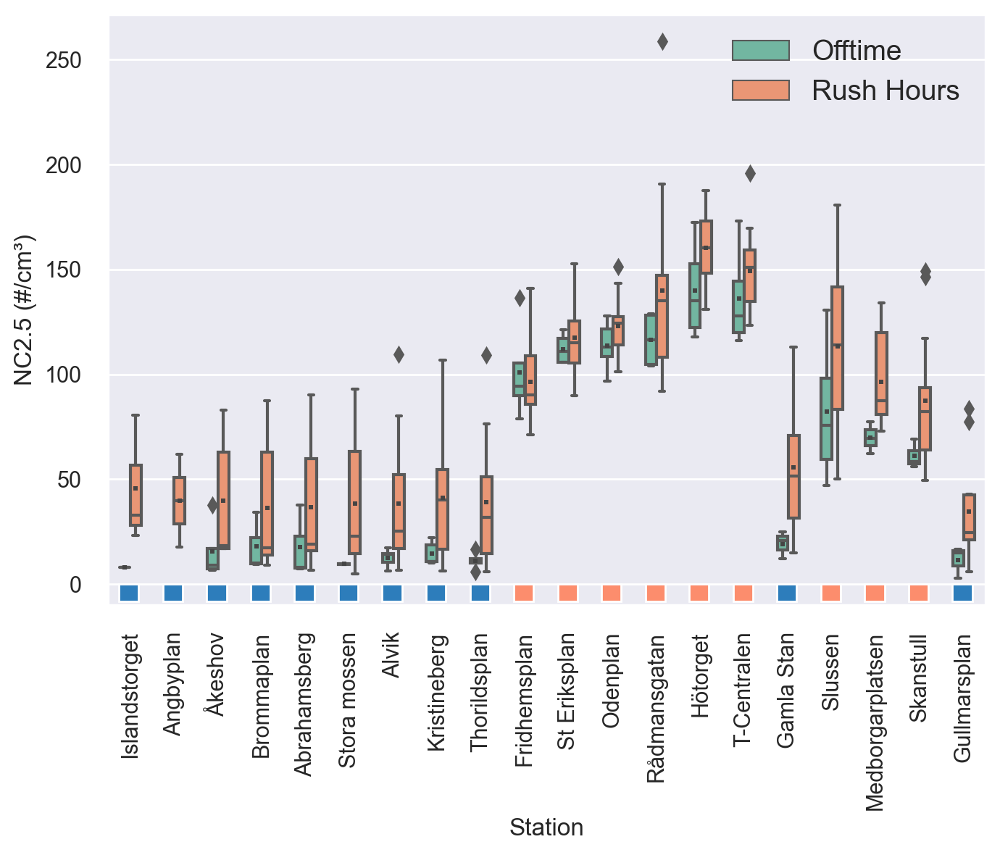

In [131]:
fig, ax = plt.subplots(figsize=[7,6], dpi=200)

plot_df = s_df.copy()
plot_df['Period'] = plot_df['Period'].apply(lambda x: 'Rush Hours' if x in ['Evening rush', 'Morning rush'] else x)

sns.boxplot(
    x='Station', 
    y=param, 
    data=plot_df, 
    width=0.5, 
    order=get_green_line(), 
    hue='Period',
    palette="Set2",
    showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    }
)

# Change color of xticks
inside_c = '#FC8D6D'
outside_c = '#2D7DBB'

i = 0
for t in ax.xaxis.get_ticklabels():
    
    c = inside_c if t.get_text() in get_inside_stations() else outside_c
    
    ax.text(
        i - 0.07, -4, 
        ' ',
        fontsize = 2, 
        zorder = 6, 
        color = 'k', 
        rotation=90, 
        bbox={'facecolor': c, 'pad':4}
    )
    
    i += 1
    
plt.legend(fontsize=14)
plt.xticks(rotation=90)
#plt.title('Box Plots Stations')
plt.ylabel(fr"{param} ({unit})")
plt.tight_layout()
plt.savefig(f'{fig_folder}/box_plots_rush_vs_offtime_color({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

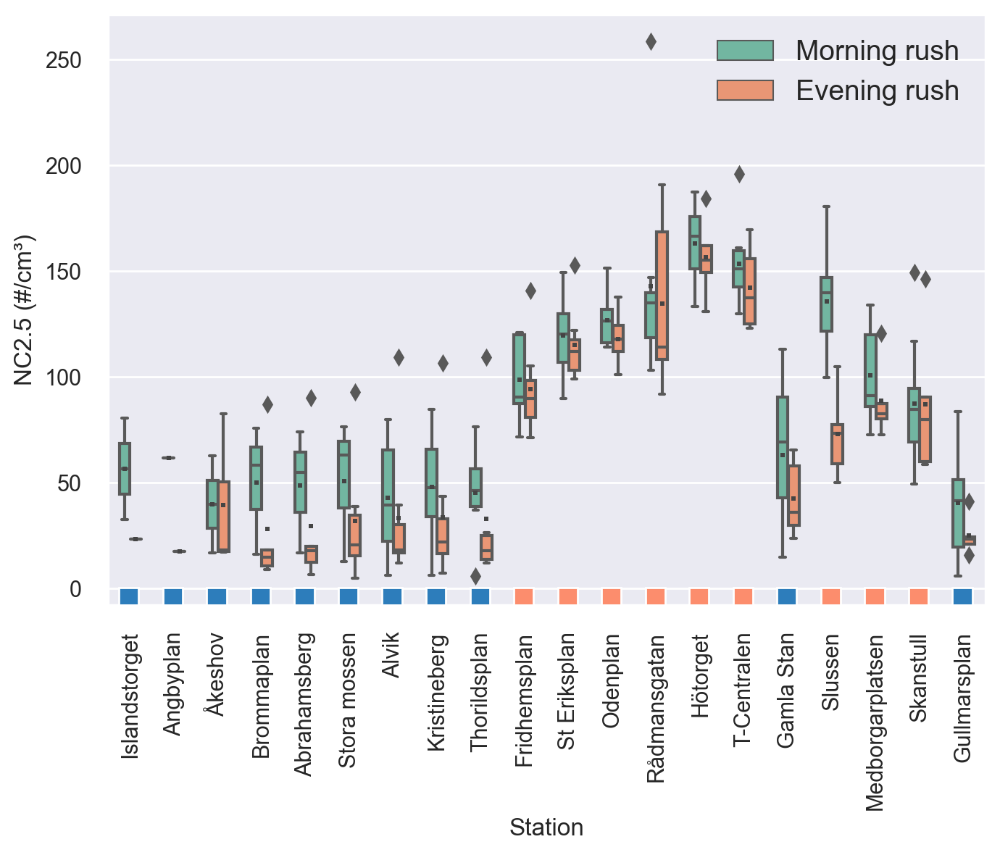

In [132]:
fig, ax = plt.subplots(figsize=[7,6], dpi=200)

plot_df = s_df.loc[s_df['Period'] != 'Offtime']

sns.boxplot(
    x='Station', 
    y=param, 
    data=plot_df, 
    width=0.5, 
    order=get_green_line(), 
    hue='Period',
    palette="Set2",
    showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    }
)

# Change color of xticks
inside_c = '#FC8D6D'
outside_c = '#2D7DBB'

i = 0
for t in ax.xaxis.get_ticklabels():
    
    c = inside_c if t.get_text() in get_inside_stations() else outside_c
    
    ax.text(
        i - 0.07, -3.5, 
        ' ',
        fontsize = 2, 
        zorder = 6, 
        color = 'k', 
        rotation=90, 
        bbox={'facecolor': c, 'pad':4}
    )
    
    i += 1
    
plt.legend(fontsize=14)
plt.xticks(rotation=90)
plt.ylabel(fr"{param} ({unit})")
#plt.title('Box Plots Stations')
plt.tight_layout()
plt.savefig(f'{fig_folder}/box_plots_morning_evening_rush_color({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

### Above-ground vs below-ground

\textit{Fridhemsplan}, \textit{St Eriksplan}, \textit{Odenplan}, \textit{Rådmansgatan}, \textit{Hötorget}, \textit{T-Centralen}, \textit{Slussen}, \textit{Medborgarplatsen}, and \textit{Skanstull}

In [219]:
underground_stations = ['Fridhemsplan', 'St Eriksplan', 'Odenplan', 'Rådmansgatan', 'Hötorget', 'T-Centralen', 'Slussen', 'Medborgarplatsen', 'Skanstull']

under_df = s_df[s_df['Station'].isin(underground_stations)]
above_df = s_df[~s_df['Station'].isin(underground_stations)]

print('Under')
print(f'{round(under_df["PM2.5"].mean(), 2)}±{round(sample_std(under_df["PM2.5"]), 2)}')

print('Above')
print(f'{round(above_df["PM2.5"].mean(), 2)}±{round(sample_std(above_df["PM2.5"]), 2)}')


Under
24.63±8.27
Above
4.96±3.78


### Histograms

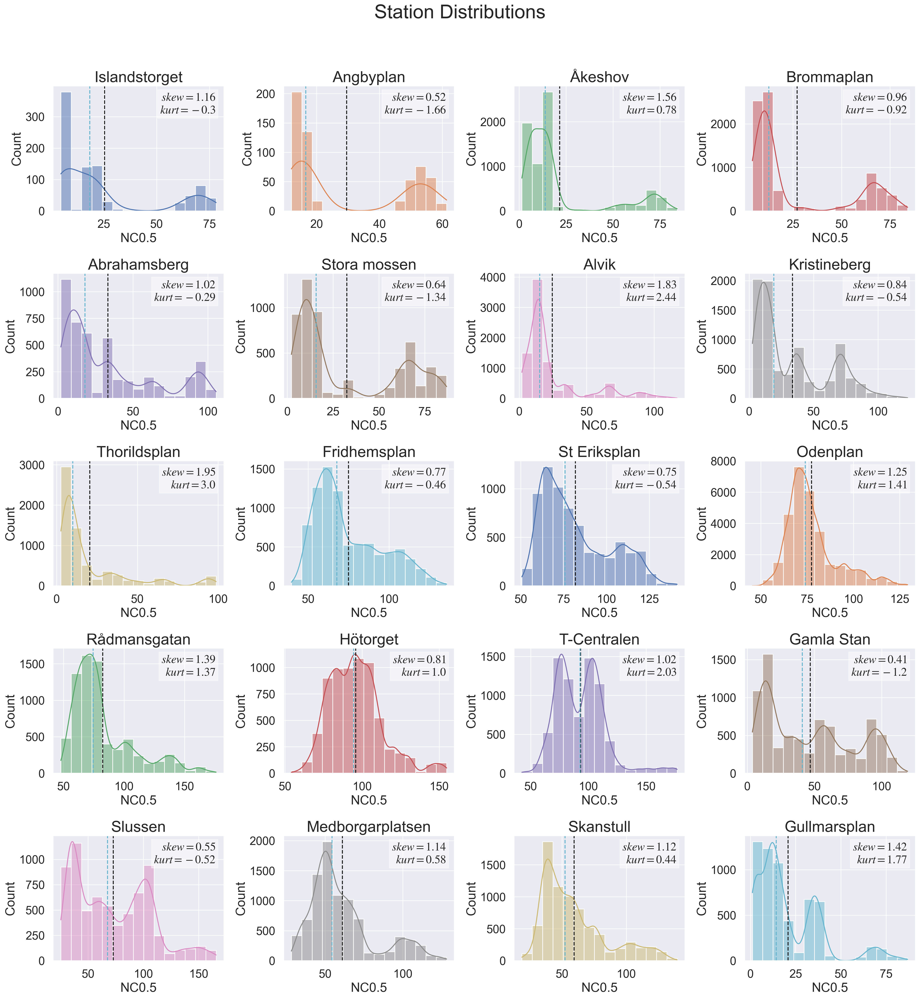

In [220]:
plot_distributions(
    df=r_df, 
    dist_col='Station', 
    title='Station Distributions', 
    fig_name=f'{fig_folder}/distributions({param}).pdf',
    param=param,
    with_textbox=True,
    column_count=4,
    bins=15
)

### Normal distribution

In [221]:
normal = r_df.groupby('Station').agg({param: [skew, kurtosis]})
normal[param].to_csv(f'{fig_folder}/tables/normal({param}).csv')

normal

NC0.5          
                      skew  kurtosis
Station                             
Abrahamsberg      1.020922 -0.290153
Alvik             1.834360  2.436836
Angbyplan         0.522649 -1.662090
Brommaplan        0.959634 -0.915981
Fridhemsplan      0.767976 -0.458320
Gamla Stan        0.410267 -1.202373
Gullmarsplan      1.419149  1.771554
Hötorget          0.805478  0.997215
Islandstorget     1.161024 -0.302372
Kristineberg      0.837872 -0.537512
Medborgarplatsen  1.135092  0.582159
Odenplan          1.250892  1.412355
Rådmansgatan      1.394451  1.366938
Skanstull         1.117053  0.436687
Slussen           0.550341 -0.516756
St Eriksplan      0.747036 -0.537708
Stora mossen      0.642367 -1.337982
T-Centralen       1.024478  2.034708
Thorildsplan      1.950412  3.002949
Åkeshov           1.558535  0.780707

#### QQ Plots

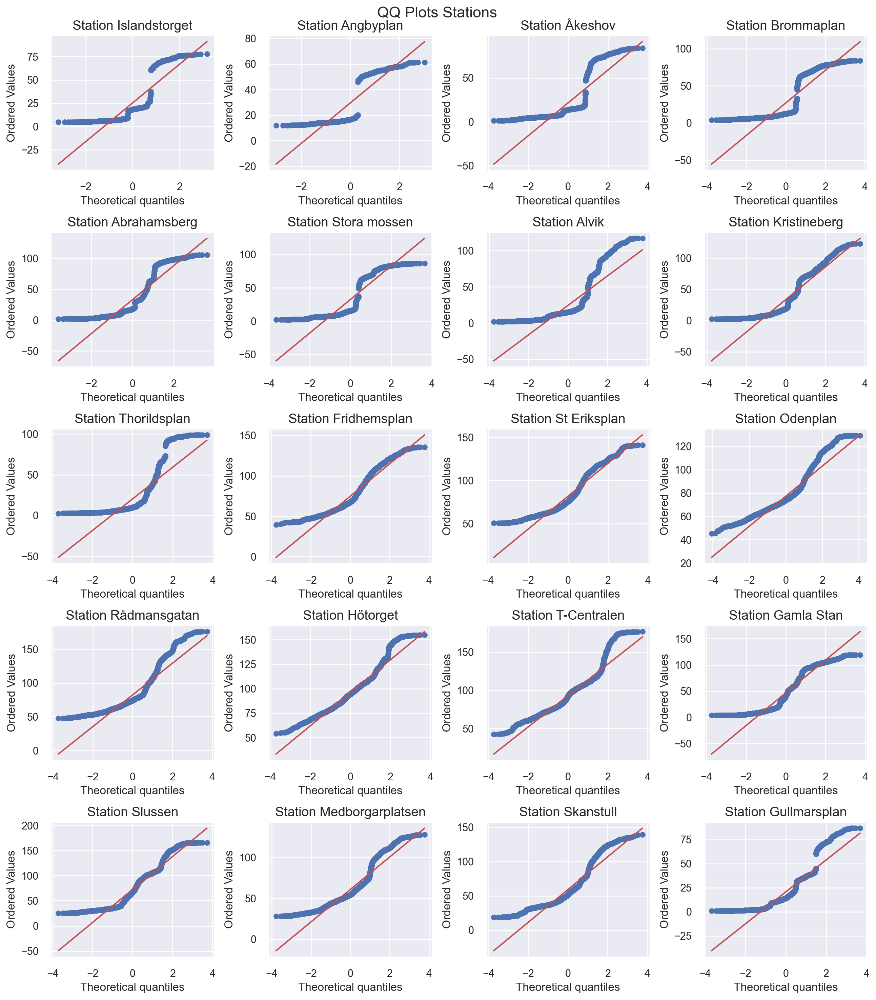

In [222]:
plot_QQ_plots(
    r_df, 
    title='QQ Plots Stations', 
    param=param, 
    fig_name=f'{fig_folder}/QQPlots({param}).pdf',
    col_count=4,
    row_count=5,
    label='Station',
    size=(13, 15)
)

### Sensor diffs

How much do the sensor means per session per station differ? Compute standard deviation per session per station.

In [101]:
station_diffs = {}
station_diffs_CI = {}

for session_id, grp in r_df.groupby('Session Id'):
    for station, station_grp in grp.groupby('Station'):
        if station not in station_diffs:
            station_diffs[station] = []
            station_diffs_CI[station] = []
            
        # Compute std
        station_diffs[station].append(sample_std(station_grp[param].values))
        
        # Compute CI
        station_diffs_CI[station].append(CI95(station_grp[param].values))
            
# Convert into one long array and make a histogram
mean_station_diffs = {s: np.mean(v) for s, v in station_diffs.items()}
mean_station_diffs_CI = {s: np.mean(v) for s, v in station_diffs_CI.items()}

station_diffs_df = pd.DataFrame(list(mean_station_diffs.items()), columns=['station', 'mean sensor std'])

station_diffs_df['CI95'] = [v[1] for v in mean_station_diffs_CI.items()]
station_diffs_df['order'] = [get_green_line().index(station) for station in mean_station_diffs.keys()]

print(f'Total mean sensor diff: {station_diffs_df["mean sensor std"].mean()}')

station_diffs_df.to_csv(f'{fig_folder}/tables/sensors_diffs_per_station({param}).csv')

station_diffs_df.sort_values(by=['mean sensor std'], ascending=False)

Total mean sensor diff: 1.466236069988657


,station,mean sensor std,CI95,order
2,Hötorget,3.934129,0.405267,13
8,T-Centralen,3.361600,0.338440,14
15,St Eriksplan,2.754218,0.332050,10
5,Rådmansgatan,2.747722,0.290752,12
4,Odenplan,2.567057,0.222192,11
7,Slussen,2.566548,0.277594,16
12,Fridhemsplan,2.037218,0.218167,9
3,Medborgarplatsen,1.844523,0.179658,17
6,Skanstull,1.647639,0.155257,18
0,Gamla Stan,1.035677,0.108361,15


### How much do every single sensor differ per station?

In [102]:
diffs = {}

for station, grp in r_df.groupby('Station'):
    diffs[station] = {}
    for sensor, sensor_grp in grp.groupby('Sensor'):
        diffs[station][sensor] = sample_std(sensor_grp[param].values)

diffs_df = pd.concat([pd.DataFrame(diffs[s].values(), index=diffs[s].keys(), columns=[s]).T for s in r_df['Station'].unique()])

diffs_df.loc['Avg'] = diffs_df.mean()

diffs_df.to_csv(f'{fig_folder}/tables/sensor_diff_per_station({param}).csv')

diffs_df

,1,2,3,4,5,6,B,A,C,D,E
Islandstorget,3.211636,3.327906,3.792090,3.326726,3.991383,0.352996,0.193980,NaN,NaN,NaN,NaN
Angbyplan,0.103136,2.943800,0.266006,0.217073,0.121511,NaN,0.222070,NaN,NaN,NaN,NaN
Åkeshov,3.473360,3.892637,3.330701,3.808935,3.719053,NaN,3.095617,0.763321,0.502801,0.618481,0.433365
Brommaplan,4.162947,3.919091,4.233889,4.354806,4.359644,0.886205,1.935534,0.396169,0.368404,0.393666,0.452739
Abrahamsberg,4.974648,4.003359,5.129500,5.264613,4.962984,3.179298,2.132978,0.552404,0.524485,0.636494,0.570312
Stora mossen,4.322610,4.176057,4.442939,4.158027,4.572867,1.129900,2.364820,0.732751,0.434401,0.630076,0.619683
Alvik,3.615531,3.384691,3.914462,4.322196,3.965400,4.789921,2.059057,1.113315,1.395966,1.590813,1.459765
Kristineberg,4.222561,4.100721,4.430787,4.285757,4.542133,4.221945,2.289297,1.629217,2.152977,1.876298,1.977068
Thorildsplan,3.596889,3.526476,4.170309,4.279091,3.951474,5.437646,2.078409,1.292157,1.680511,1.597459,1.461563
Fridhemsplan,6.592349,6.477304,6.637651,6.405331,6.186111,2.079107,3.624775,3.982647,4.531233,2.342707,3.652811


## Anova results between stations

This makes sense. We want to see if the stations differ!!

In [103]:
anova_df = perform_ANOVA(
    r_df,
    param=param,
    alpha=0.01,
    group_name='Station'
)

anova_df.to_csv(f'{fig_folder}/tables/StationsAnova({param}).csv')
anova_df

,0
SST,23826791.251044
SSW,3844694.775636
SSB,19982096.475408
Alpha,0.01
F-stat,42317.099894
F-crit,1.904901
P-value,0.0
F-stat > F-crit,True (Significant Difference)
p-value < alpha,True (Significant Difference)


In [104]:
tukey_df = r_df[[param, 'Station']]

tukey = pairwise_tukeyhsd(
    endog=tukey_df[param],
    groups=tukey_df['Station'],
    alpha=0.01
)

tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
tukey_df.to_csv(f'{fig_folder}/tables/StationsTukey({param}).csv')

print(tukey)

           Multiple Comparison of Means - Tukey HSD, FWER=0.01            
     group1           group2      meandiff p-adj   lower    upper   reject
--------------------------------------------------------------------------
    Abrahamsberg            Alvik  -1.1709  0.001  -1.5362  -0.8056   True
    Abrahamsberg        Angbyplan  -0.7033 0.1493  -1.5875   0.1809  False
    Abrahamsberg       Brommaplan  -0.9579  0.001  -1.3269   -0.589   True
    Abrahamsberg     Fridhemsplan  14.2364  0.001  13.8693  14.6035   True
    Abrahamsberg       Gamla Stan    3.853  0.001   3.4801   4.2259   True
    Abrahamsberg     Gullmarsplan  -1.3167  0.001  -1.7103  -0.9231   True
    Abrahamsberg         Hötorget  30.3868  0.001  30.0043  30.7693   True
    Abrahamsberg    Islandstorget  -1.3186  0.001   -2.044  -0.5932   True
    Abrahamsberg     Kristineberg   0.3501 0.0215  -0.0188   0.7191  False
    Abrahamsberg Medborgarplatsen  12.2422  0.001  11.8778  12.6066   True
    Abrahamsberg         

# Focus on Hötorget

In [23]:
focus_s_df = s_df.loc[s_df.Station == 'Hötorget'].sort_values(by=['Timestamp'])
focus_r_df = r_df.loc[r_df.Station == 'Hötorget'].sort_values(by=['Sensor'])

### Box plots sensors

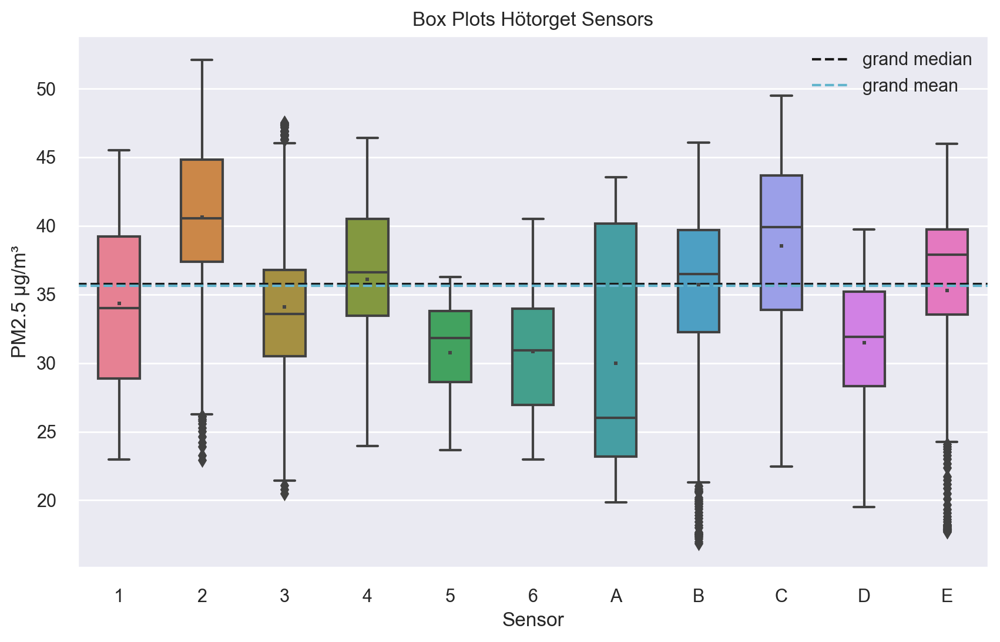

In [24]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

sns.boxplot(x='Sensor', y=param, data=focus_r_df, width=0.5, palette='husl',  showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })

plt.axhline(focus_r_df[param].median(), c='k', linestyle='--', label='grand median')
plt.axhline(focus_r_df[param].mean(), c='c', linestyle='--', label='grand mean')

plt.legend()
plt.ylabel(fr"{param} {unit}")
plt.title('Box Plots Hötorget Sensors')
plt.savefig(f'{fig_folder}/Hotorget_box_plot_sensor({param}).pdf', dpi=300, bbox_inches="tight")
plt.show()

In [25]:
station_diffs['Hötorget']

NameError: name 'station_diffs' is not defined

In [26]:
# Compute median, lower quartile, upper quartile, IQR, lower limit and upper limit
quantiles = focus_r_df.groupby('Sensor').agg(
    {param: 
     [Q1, Q2, Q3, IQR, lowerLimit, upperLimit, outliers, prcnt_outliers, 'count']
    }
)

# Display stats
quantiles.to_csv(f'{fig_folder}/tables/Hotorget_quantiles({param}).csv')
quantiles

PM2.5                                                           \
             Q1      Q2       Q3      IQR lowerLimit upperLimit outliers   
Sensor                                                                     
1       28.8850  33.990  39.2350  10.3500   13.36000   54.76000      0.0   
2       37.3800  40.530  44.8150   7.4350   26.22750   55.96750     12.0   
3       30.5150  33.590  36.7850   6.2700   21.11000   46.19000     27.0   
4       33.4300  36.600  40.5100   7.0800   22.81000   51.13000      0.0   
5       28.6300  31.840  33.8100   5.1800   20.86000   41.58000      0.0   
6       26.9600  30.930  33.9750   7.0150   16.43750   44.49750      0.0   
A       23.2025  26.010  40.1850  16.9825   -2.27125   65.65875      0.0   
B       32.2700  36.480  39.7000   7.4300   21.12500   50.84500     27.0   
C       33.8975  39.925  43.6825   9.7850   19.22000   58.36000      0.0   
D       28.3350  31.920  35.2050   6.8700   18.03000   45.51000      0.0   
E       33.5375  37.900  39.7425   6.2050   24.23000   49.05000     40.0   

                             
       prcnt_outliers count  
Sensor                       
1            0.000000   506  
2            0.935308  1283  
3            3.233533   835  
4            0.000000   773  
5            0.000000   345  
6            0.000000   271  
A            0.000000   218  
B            2.072141  1303  
C            0.000000   424  
D            0.000000   423  
E            9.345794   428

### Box plot sessions

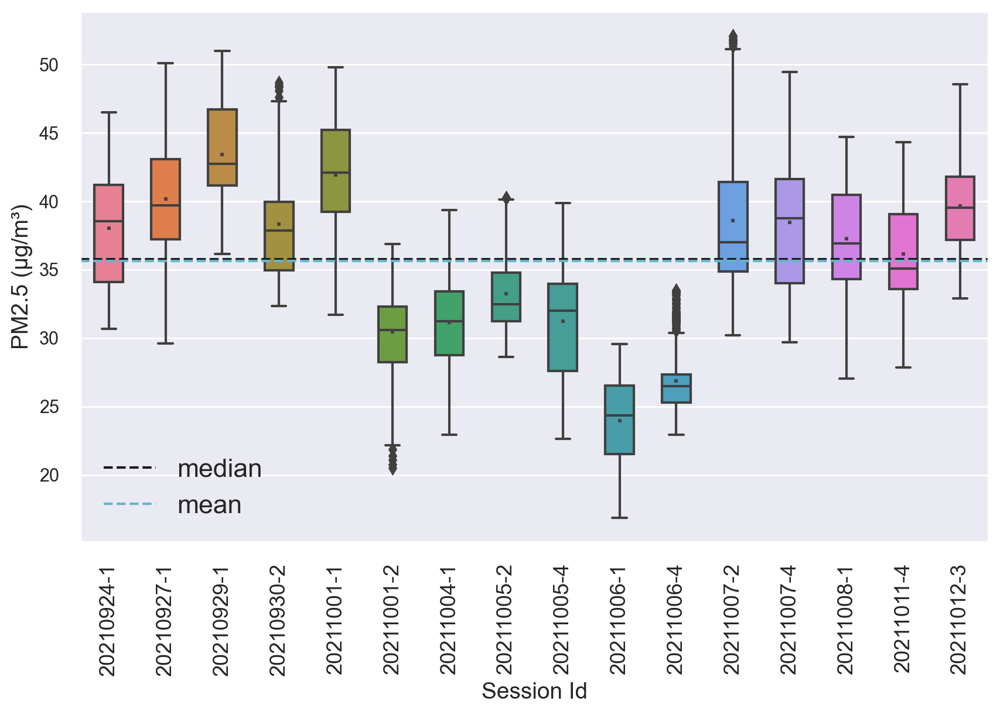

In [34]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

sns.boxplot(x='Session Id', y=param, data=focus_r_df.sort_values(by=['Timestamp']), width=0.5, palette='husl',  showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })

plt.axhline(focus_r_df[param].median(), c='k', linestyle='--', label='median')
plt.axhline(focus_r_df[param].mean(), c='c', linestyle='--', label='mean')

plt.xticks(rotation=90, fontsize=13)
plt.legend(fontsize=16)
plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Session Id', fontsize=14)
#plt.title('Box Plots Hötorget Sessions')
plt.savefig(f'{fig_folder}/Hotorget_box_plot_sessions({param}).pdf', dpi=300, bbox_inches="tight")
plt.show()

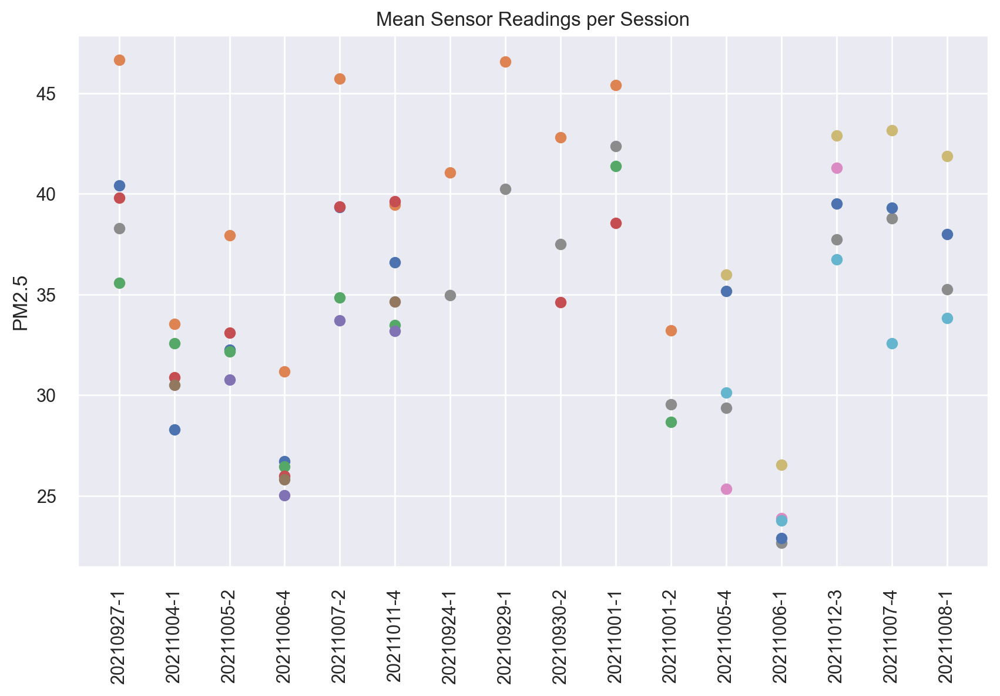

In [110]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

session_sensors = {}
for sensor, grp in focus_r_df.groupby('Sensor'):
    if sensor not in session_sensors:
        session_sensors[sensor] = {}
        
    for session_id, session_grp in grp.groupby('Session Id'):
        session_sensors[sensor][session_id] = session_grp[param].mean()
        
for sensor, data in session_sensors.items():
    ax.scatter(data.keys(), data.values(), label=sensor)
    
plt.xticks(rotation=90)
#plt.legend()
plt.title('Mean Sensor Readings per Session')
plt.savefig(f'{fig_folder}/Hotorget_mean_sensor_reading_per_session({param}).pdf', dpi=300, bbox_inches="tight")
plt.ylabel(param)

plt.show()

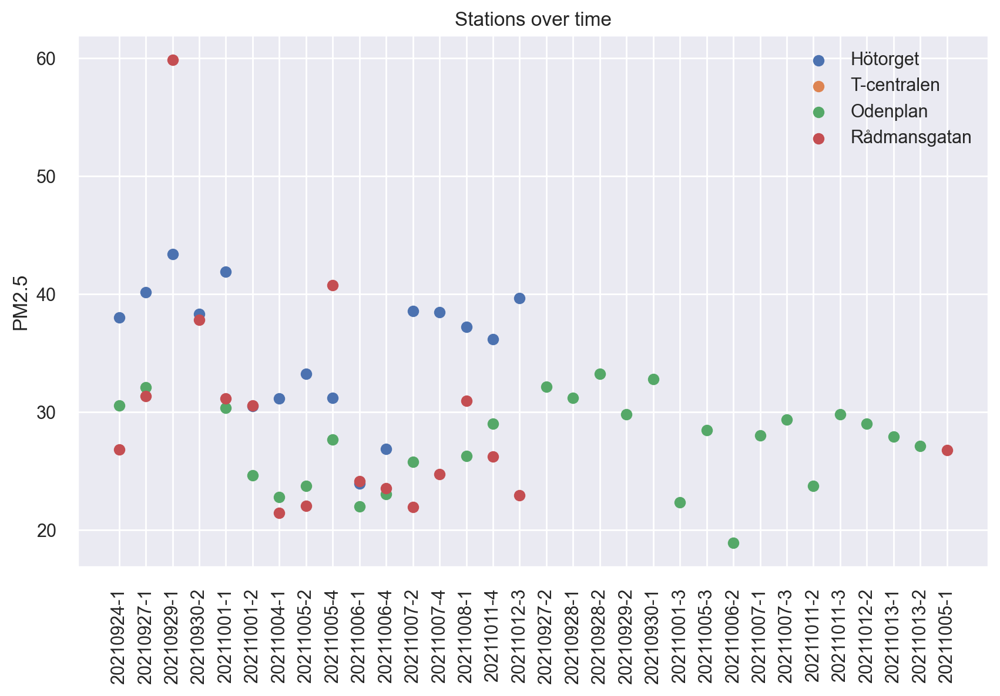

In [111]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

for station in ['Hötorget', 'T-centralen', 'Odenplan', 'Rådmansgatan']:
    session_means = {}
    for session, grp in r_df[r_df['Station'] == station].groupby('Session Id'):
        session_means[session] = grp[param].mean()

    ax.scatter(session_means.keys(), session_means.values(), label=station)
    
plt.xticks(rotation=90)
plt.legend()
#plt.legend()
plt.title('Stations over time')
plt.savefig(f'{fig_folder}/focus_dfs_over_time({param}).pdf', dpi=300, bbox_inches="tight")
plt.ylabel(param)

plt.show()

### Distribution

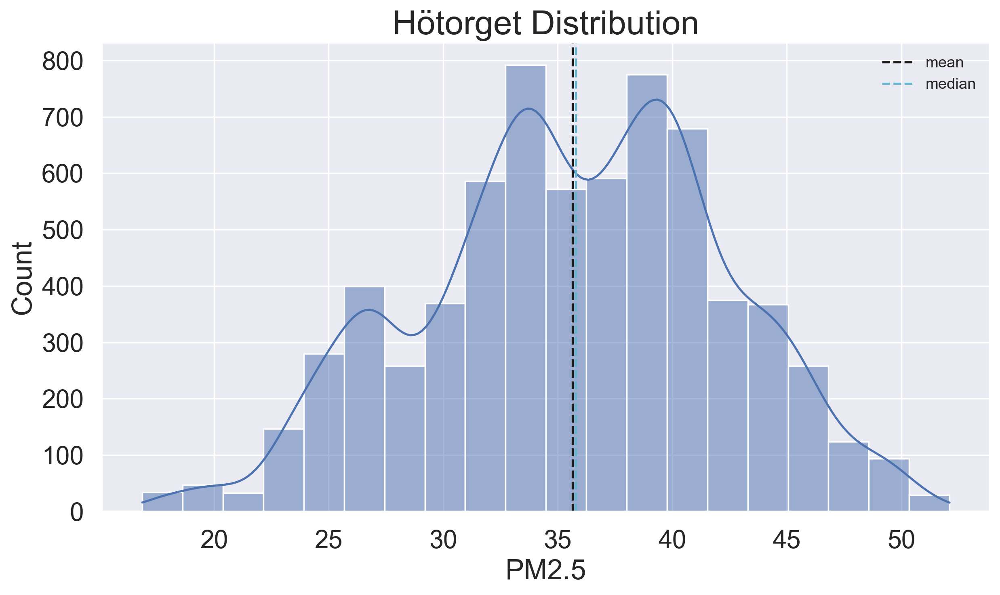

In [35]:
fig, ax = plt.subplots(dpi=250, figsize=[10, 6])

mean = focus_r_df[param].mean()
median = focus_r_df[param].median()
std = sample_std(focus_r_df[param].values)
s_skew = stats.skew(focus_r_df[param], bias=False)
s_kurt = stats.kurtosis(focus_r_df[param], bias=False)

sns.histplot(focus_r_df, x=param, kde=True, bins=20)

ax.tick_params(axis="x", labelsize=18)
ax.tick_params(axis="y", labelsize=18)

ax.set_xlabel(param, fontsize=20)
ax.set_ylabel("Count", fontsize=20)
ax.set_title(f"Hötorget Distribution", fontsize=24)

ax.axvline(mean, c="k", linestyle="--", label="mean")
ax.axvline(median, c="c", linestyle="--", label="median")
ax.legend()
plt.tight_layout()

plt.savefig(f'{fig_folder}/HotorgetDistribution({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

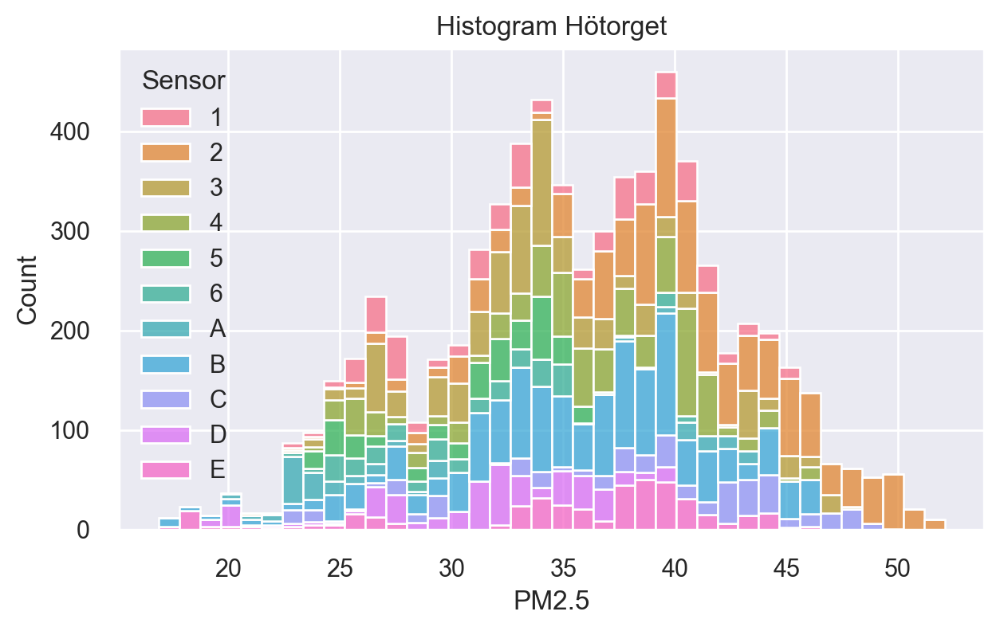

In [113]:
fig, ax = plt.subplots(figsize=[7,4], dpi=200)

sns.histplot(focus_r_df.sort_values(by=['Sensor']), x=param, hue='Sensor', multiple='stack')
plt.title('Histogram Hötorget')

plt.savefig(f'{fig_folder}/HotorgetHistogram1Sensor({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

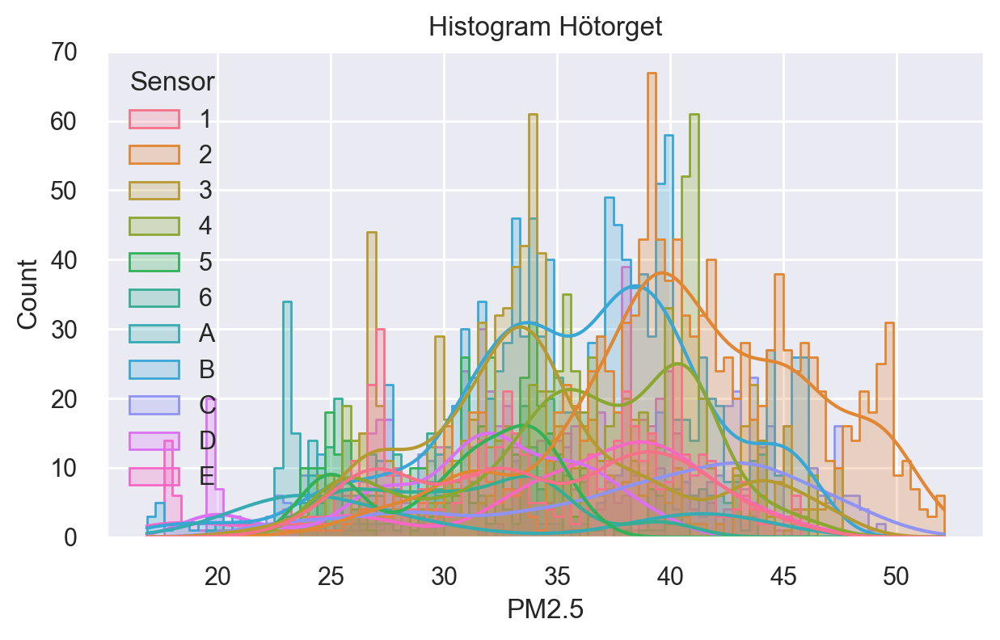

In [114]:
fig, ax = plt.subplots(figsize=[7,4], dpi=200)

sns.histplot(focus_r_df.sort_values(by=['Sensor']), x=param, hue='Sensor', kde=True, element='step', bins=94)
plt.title('Histogram Hötorget')

plt.savefig(f'{fig_folder}/HotorgetHistogram2Sensor({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

## ANOVA

In [115]:
anova_df = perform_ANOVA(
    focus_r_df,
    param=param,
    alpha=0.1,
)

anova_df.to_csv(f'{fig_folder}/tables/Hötorget_Anova({param}).csv')
anova_df

,0
SST,295047.814574
SSW,227733.968812
SSB,67313.845762
Alpha,0.1
F-stat,200.935998
F-crit,1.599657
P-value,0.0
F-stat > F-crit,True (Significant Difference)
p-value < alpha,True (Significant Difference)


In [116]:
# Anova per session
anovas = []

for session_id in focus_r_df['Session Id'].unique():
    anova_df = perform_ANOVA(
        focus_r_df[focus_r_df['Session Id'] == session_id],
        param=param,
        alpha=0.1,
    )
    
    anovas.append(anova_df)
    
anovas_df = pd.concat(anovas, axis=1)

anovas_df.to_csv(f'{fig_folder}/tables/Hötorget_Anovas({param}).csv')
anovas_df

,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SST,11530.251131,8586.438319,2960.138243,8864.442191,2691.2475,4121.94123,10620.684802,5142.162075,13605.374747,2442.1313,3175.890863,4267.090242,7076.432948,4506.524588,6196.595076,10585.000613
SSW,4898.220966,3572.376741,820.278864,2975.903394,634.886053,3051.142098,4716.667384,3635.176491,8712.067149,1124.0321,1099.936797,3492.713385,1939.450003,2714.414847,2756.428708,3960.215206
SSB,6632.030165,5014.061578,2139.859379,5888.538797,2056.361447,1070.799133,5904.017418,1506.985584,4893.307598,1318.0992,2075.954066,774.376857,5136.982945,1792.10974,3440.166367,6624.785408
Alpha,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
F-stat,165.522481,201.271165,227.608852,160.772617,329.724672,27.900546,799.858634,79.387546,151.276479,152.444842,167.973208,22.171211,215.867441,57.934265,150.182258,254.828486
F-crit,1.956389,1.855322,1.961035,1.962235,1.858621,1.962619,2.713405,2.316484,2.090581,2.74452,2.33263,1.958965,1.962182,1.960942,2.099018,2.09581
P-value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
F-stat > F-crit,True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference)
p-value < alpha,True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference),True (Significant Difference)


### Tukey

In [117]:
tukey_df = focus_r_df[[param, 'Sensor']]

tukey = pairwise_tukeyhsd(
    endog=tukey_df[param],
    groups=tukey_df['Sensor'],
    alpha=0.1
)

print(tukey)

 Multiple Comparison of Means - Tukey HSD, FWER=0.10 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     1      2   6.2782  0.001   5.3733  7.1832   True
     1      3  -0.2525    0.9  -1.2237  0.7187  False
     1      4   1.7434  0.001   0.7576  2.7292   True
     1      5  -3.5892  0.001  -4.7928 -2.3856   True
     1      6  -3.4936  0.001  -4.7912 -2.1959   True
     1      A  -4.3594  0.001   -5.756 -2.9628   True
     1      B   1.3455  0.001   0.4425  2.2485   True
     1      C   4.1984  0.001   3.0634  5.3334   True
     1      D  -2.8902  0.001  -4.0259 -1.7545   True
     1      E   0.9564 0.2954  -0.1757  2.0885  False
     2      3  -6.5308  0.001  -7.2973 -5.7643   True
     2      4  -4.5349  0.001  -5.3198 -3.7499   True
     2      5  -9.8674  0.001 -10.9129  -8.822   True
     2      6  -9.7718  0.001 -10.9243 -8.6193   True
     2      A -10.6377  0.001 -11.9005 -9.3748   True
     2      B  -4.9328  0.00

In [118]:
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])

tukey_df.to_csv(f'{fig_folder}/tables/Hötorget_Tukey({param}).csv')

## Systematic Error

How much would the sensors need to be wrong to get the value of 35?

In [119]:
h_mean = focus_s_df[param].mean()
h_std = sample_std(focus_s_df[param].values)

print(f'{round(h_mean, 2)}±{round(h_std, 2)}')

35.55±5.5


In [120]:
# If sensors measure 5microgram per cubic meter
# According to datasheet - ±10 units
# 5 --> max 15 (need to differ with 30.55 units --> 3 times more than datasheet (increase 200%))
# 15 --> max 25 (need to differ with 20.55 units --> 2 times more than datasheet (increase 100%))

# Min value with std: 30.11, still 5 units over

In [121]:
round(h_mean - h_std, 2)

30.05

In [122]:
# 5 barrier
increase = h_mean - 5
prcnt = increase / 10

print(increase)
print(prcnt)

30.551593736349915
3.0551593736349916


In [123]:
# 15 barrier
increase = h_mean - 15
prcnt = increase / 10

print(increase)
print(prcnt)

20.551593736349915
2.0551593736349916


In [124]:
h_mean - 5

30.551593736349915

### Comparison with aboveground measurements

One explanation: a lot of traffic above

# Size Distributions
How much do the size for the different sensors distribute themselves?

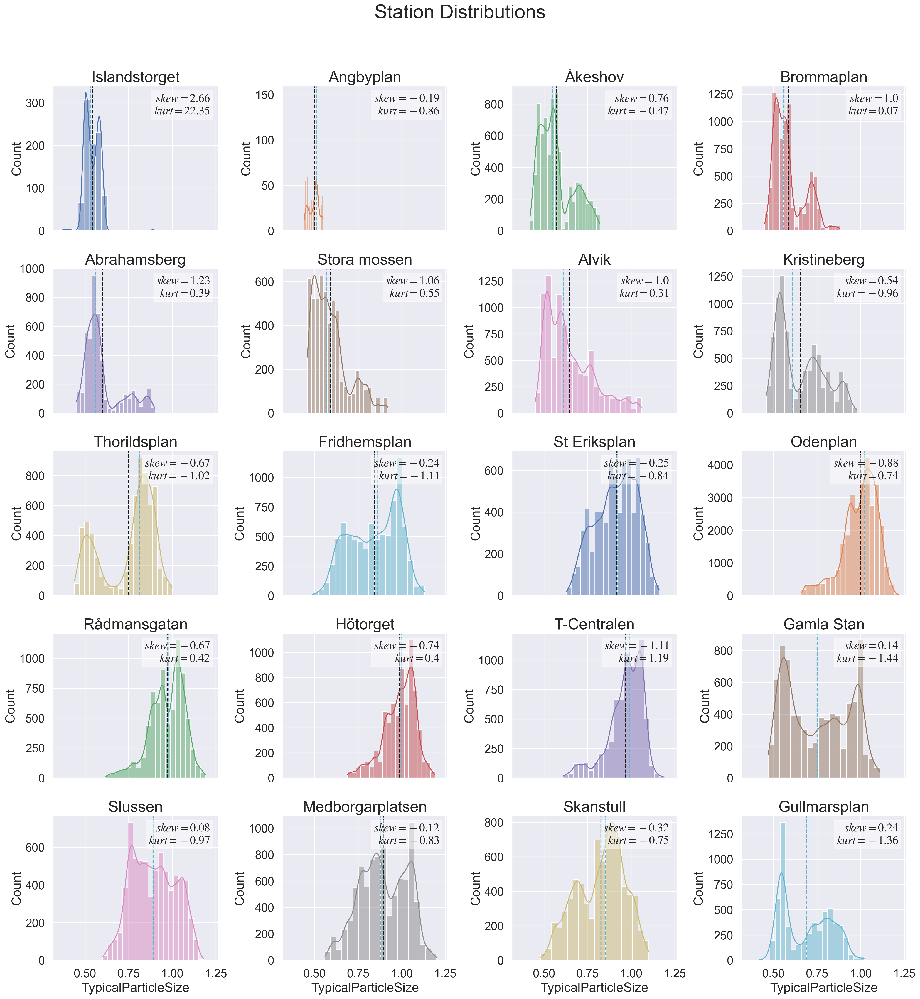

In [5]:
plot_distributions(
    df=r_df, 
    dist_col='Station', 
    title='Station Distributions', 
    fig_name=f'{fig_folder}/typical_particle_size_distribution({param}).pdf',
    param='TypicalParticleSize',
    with_textbox=True,
    column_count=4,
    bins=20,
    share_x=True,
    share_y=False
)

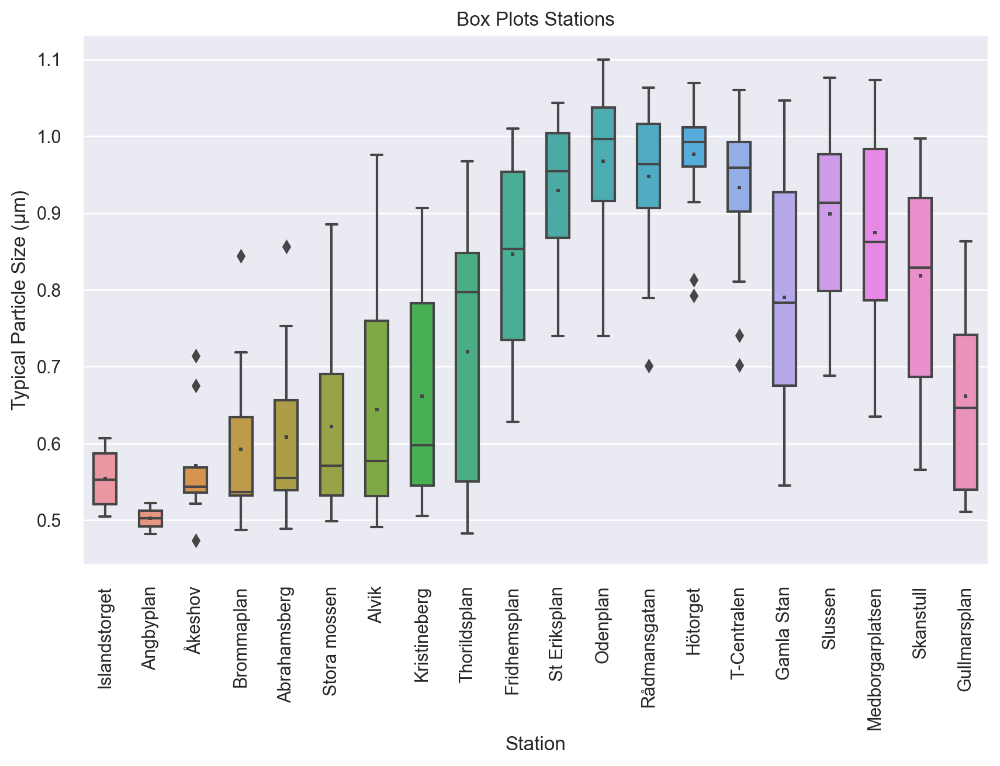

In [8]:
fig, ax = plt.subplots(figsize=[10,6], dpi=200)

sns.boxplot(x='Station', y='TypicalParticleSize', data=s_df, width=0.5, order=get_green_line(), showmeans=True,
    #meanline=True, 
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })
plt.xticks(rotation=90)
plt.title('Box Plots Stations')
plt.ylabel(fr"Typical Particle Size (µm)")
plt.savefig(f'{fig_folder}/box_plots(TypicalParticleSize).pdf', dpi=300, bbox_inches="tight")


plt.show()

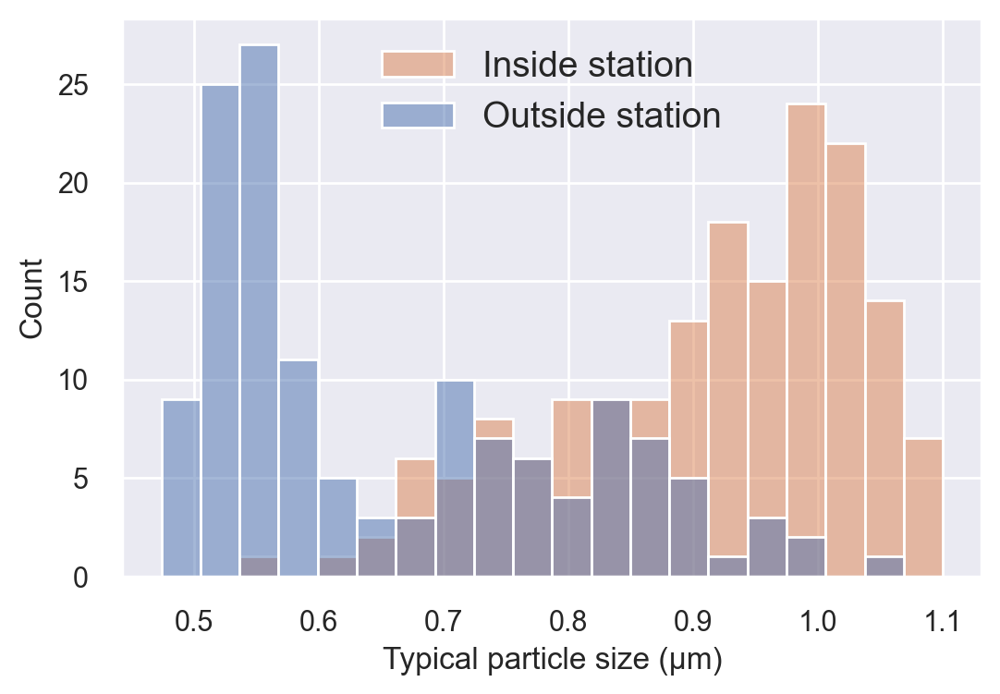

In [142]:
inside_stations = [
    'Fridhemsplan', 
    'St Eriksplan', 
    'Odenplan', 
    'Rådmansgatan', 
    'Hötorget', 
    'T-Centralen', 
    'Slussen', 
    'Medborgarplatsen',
    'Skanstull'
]

dist_df = s_df.copy()
dist_df['Inside'] = dist_df['Station'].apply(lambda x: x in inside_stations)

fig, ax = plt.subplots(figsize=[6,4], dpi=200)

#sns.histplot(dist_df, x='TypicalParticleSize', hue='Inside', kde=False, bins=20)
sns.histplot(dist_df, x='TypicalParticleSize', hue='Inside', kde=False, bins=20)
#sns.displot(dist_df, x='TypicalParticleSize', hue='Inside', kind='kde', multiple='stack')
plt.legend(['Inside station', 'Outside station'], fontsize=14)
plt.ylabel('Count')
plt.xlabel('Typical particle size (µm)')

plt.savefig(f'{fig_folder}/DistPlotSize({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

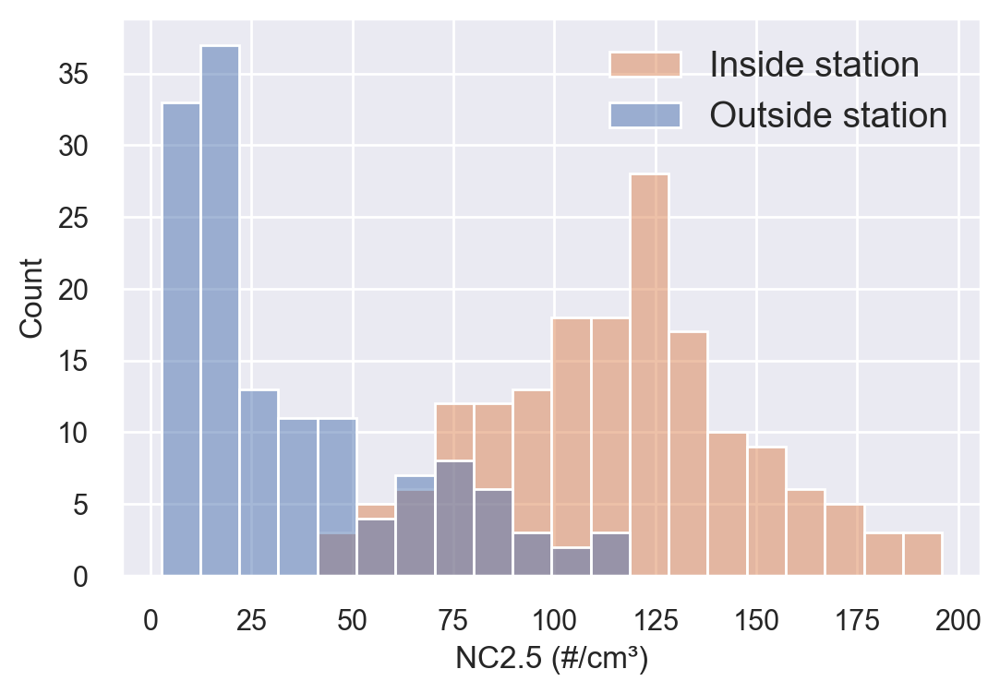

In [137]:
inside_stations = [
    'Fridhemsplan', 
    'St Eriksplan', 
    'Odenplan', 
    'Rådmansgatan', 
    'Hötorget', 
    'T-Centralen', 
    'Slussen', 
    'Medborgarplatsen',
    'Skanstull'
]

dist_df = s_df.copy()
dist_df['Inside'] = dist_df['Station'].apply(lambda x: x in inside_stations)
dist_df = dist_df[dist_df['PM2.5'] <= 55]

fig, ax = plt.subplots(figsize=[6,4], dpi=200)

#sns.histplot(dist_df, x='TypicalParticleSize', hue='Inside', kde=False, bins=20)
sns.histplot(dist_df, x=param, hue='Inside', kde=False, bins=20)
#sns.displot(dist_df, x='TypicalParticleSize', hue='Inside', kind='kde', multiple='stack')
plt.legend(['Inside station', 'Outside station'], fontsize=14)
plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')

plt.savefig(f'{fig_folder}/DistPlot1({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

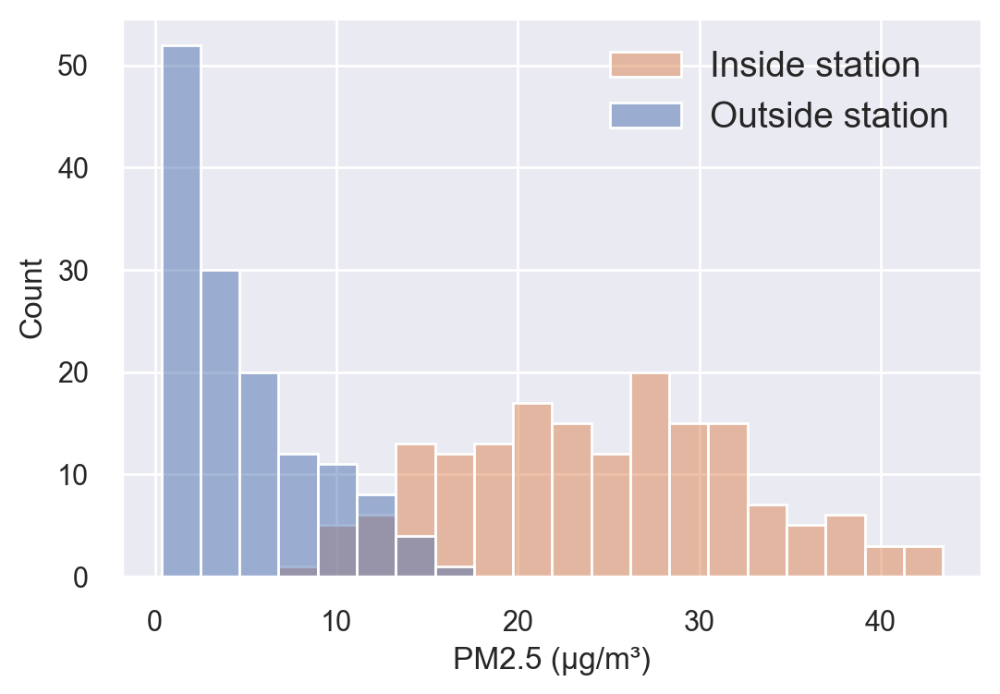

In [144]:
inside_stations = [
    'Fridhemsplan', 
    'St Eriksplan', 
    'Odenplan', 
    'Rådmansgatan', 
    'Hötorget', 
    'T-Centralen', 
    'Slussen', 
    'Medborgarplatsen',
    'Skanstull'
]

dist_df = s_df.copy()
dist_df['Inside'] = dist_df['Station'].apply(lambda x: x in inside_stations)
dist_df = dist_df[dist_df[param] <= 55]

fig, ax = plt.subplots(figsize=[6,4], dpi=200)

#sns.histplot(dist_df, x='TypicalParticleSize', hue='Inside', kde=False, bins=20)
sns.histplot(dist_df, x=param, hue='Inside', kde=False, bins=20)
#sns.displot(dist_df, x='TypicalParticleSize', hue='Inside', kind='kde', multiple='stack')
plt.legend(['Inside station', 'Outside station'], fontsize=14)
plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')

plt.savefig(f'{fig_folder}/DistPlot({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

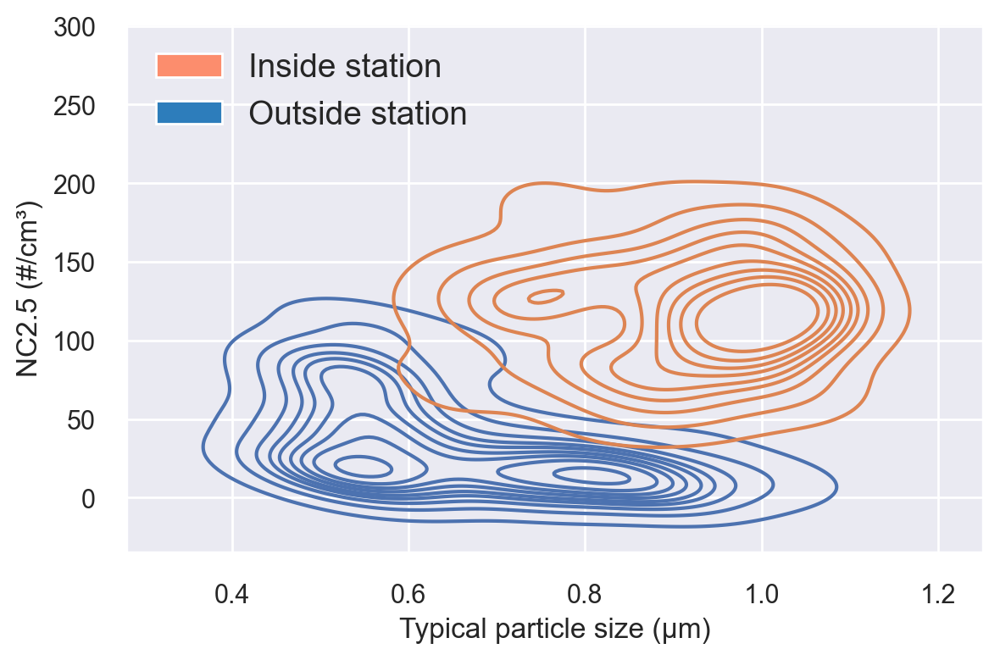

In [139]:
import matplotlib.patches as  mpatches

fig, ax = plt.subplots(figsize=[6,4], dpi=200)

station_labels = ['Inside station', 'Outside station']
g = sns.kdeplot(data=dist_df, x='TypicalParticleSize', y=param, hue='Inside', shade=False)

plt.legend(['Inside station', 'Outside station'], fontsize=14)
plt.xlabel('Typical particle size (µm)')
plt.ylabel(f'{param} ({unit})')

handles = [mpatches.Patch(facecolor=plt.cm.Reds(100), label="Inside station"),
           mpatches.Patch(facecolor=plt.cm.Blues(180), label="Outside station")]

plt.legend(handles=handles, loc=2, fontsize=14)
plt.tight_layout()

plt.savefig(f'{fig_folder}/KdePlotSize{param}Shade.pdf', dpi=300, bbox_inches="tight")

plt.show(g)

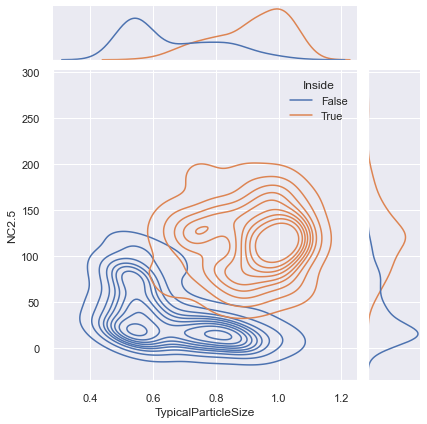

In [140]:
sns.jointplot(
    data=dist_df,
    x="TypicalParticleSize", y=param, hue="Inside",
    kind="kde"
)

In [283]:
s_df['NC0.5-NC1.0'] = s_df['NC1.0'] - s_df['NC0.5']
s_df['NC1.0-NC2.5'] = s_df['NC2.5'] - s_df['NC1.0']
s_df['NC2.5-NC10'] = s_df['NC10'] - s_df['NC2.5']

In [308]:
#y = NC
#hue = NC_type

size_dfs = []
#columns = ['NC0.5', 'NC0.5-NC1.0', 'NC1.0-NC2.5', 'NC2.5-NC10']
columns = ['NC0.5', 'NC0.5-NC1.0', 'NC1.0-NC2.5']

for c in columns:
    size_df = s_df[['Station', c]]
    size_df = size_df.rename(columns={c: 'Count (#/cm^3)'})
    size_df['type'] = c
    size_dfs.append(size_df)
    
total_size_df = pd.concat(size_dfs)
total_size_df

,Station,Count (#/cm^3),type
22,Islandstorget,6.818786,NC0.5
40,Islandstorget,26.407333,NC0.5
172,Islandstorget,69.396294,NC0.5
215,Islandstorget,20.070288,NC0.5
212,Angbyplan,15.200169,NC0.5
...,...,...,...
202,Gullmarsplan,0.231468,NC1.0-NC2.5
245,Gullmarsplan,0.292581,NC1.0-NC2.5
223,Gullmarsplan,0.763643,NC1.0-NC2.5
79,Gullmarsplan,0.455905,NC1.0-NC2.5


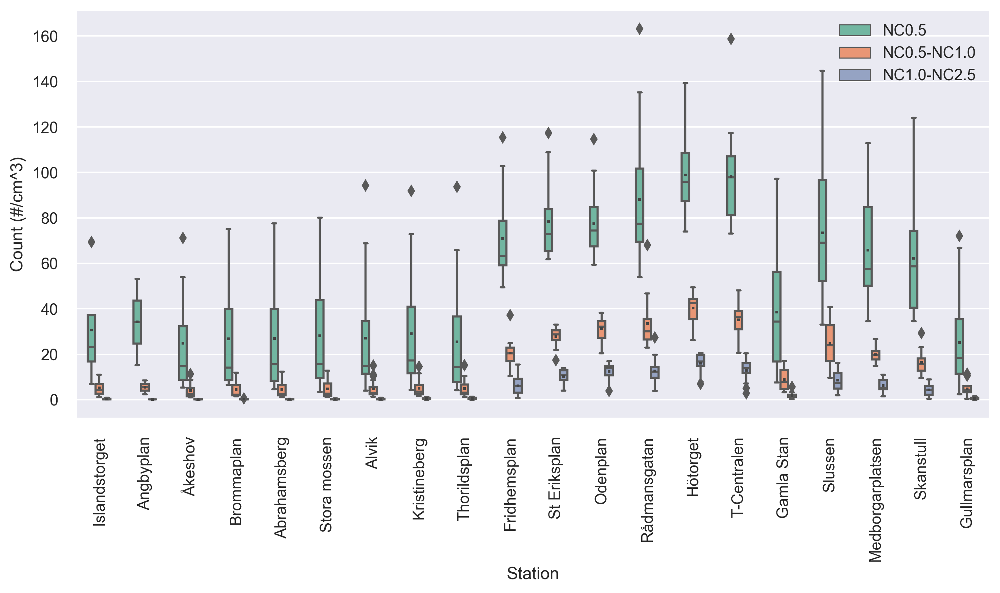

In [311]:
fig, ax = plt.subplots(figsize=[10,6], dpi=300)

sns.boxplot(
    x='Station', 
    y='Count (#/cm^3)', 
    data=total_size_df, 
    width=0.5, 
    order=get_green_line(), 
    hue='type',
    palette="Set2",
    showmeans=True,
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    }
)

plt.legend()
plt.xticks(rotation=90)
#plt.title('Box Plots Stations')
plt.tight_layout()
plt.savefig(f'{fig_folder}/box_plots_NC_sizes.pdf', dpi=300, bbox_inches="tight")

plt.show()

In [6]:
dist_df.groupby('Inside').agg({'PM2.5': ['mean', CI95]})

PM2.5          
             mean      CI95
Inside                     
False    4.964314  0.630222
True    24.631838  1.247180

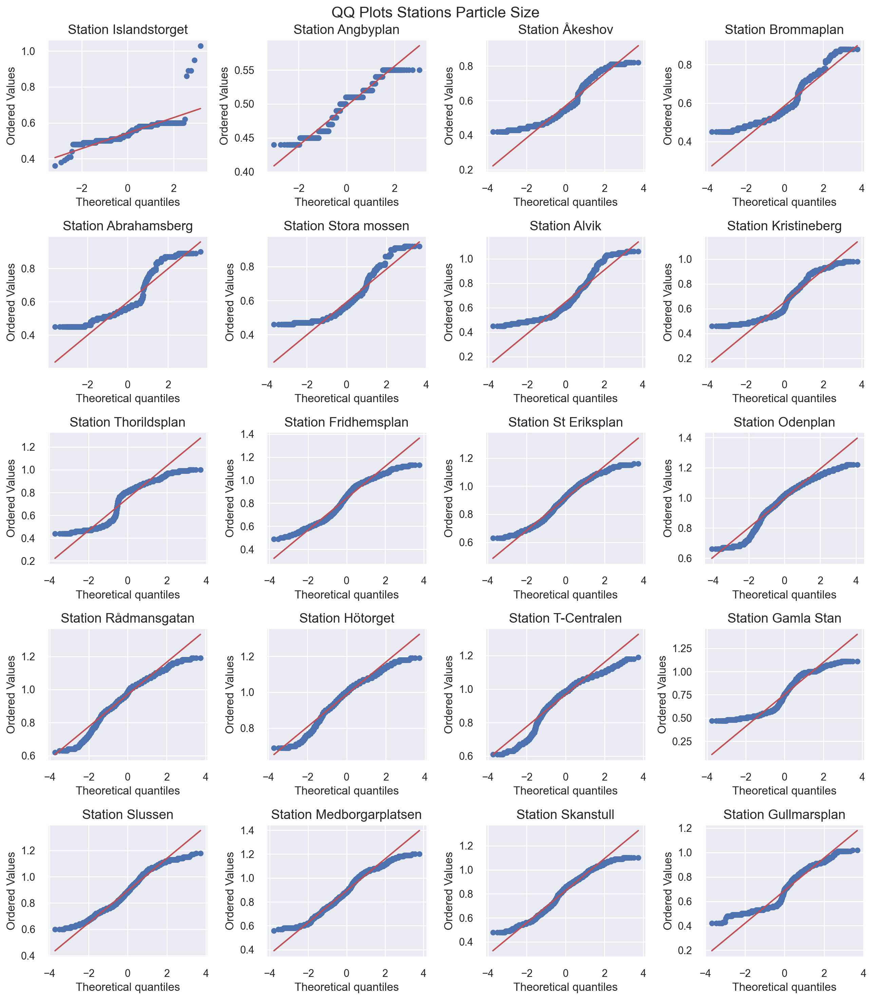

In [248]:
plot_QQ_plots(
    r_df, 
    title='QQ Plots Stations Particle Size', 
    param='TypicalParticleSize', 
    fig_name=f'{fig_folder}/QQPlots(typical_particle_size).pdf',
    col_count=4,
    row_count=5,
    label='Station',
    size=(13, 15)
)

# Correlation Heat Map

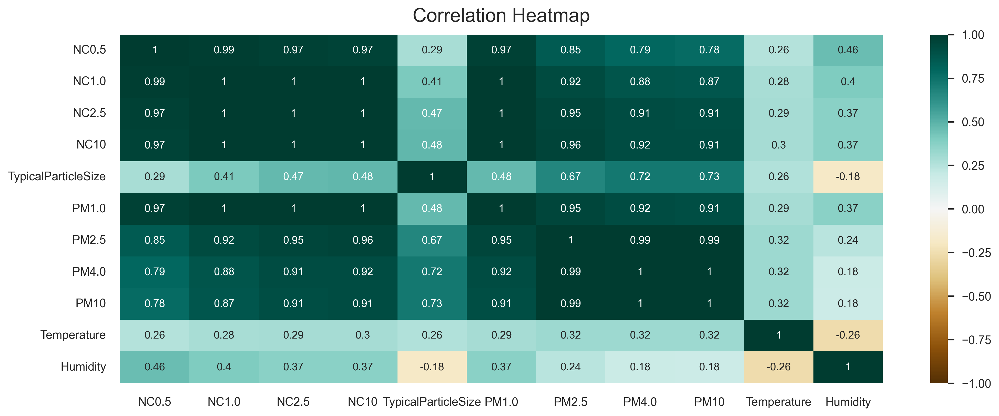

In [261]:
plt.figure(figsize=(16, 6), dpi=300)

heatmap = sns.heatmap(s_df.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig(f'{fig_folder}/heatmap.pdf', dpi=300, bbox_inches='tight')

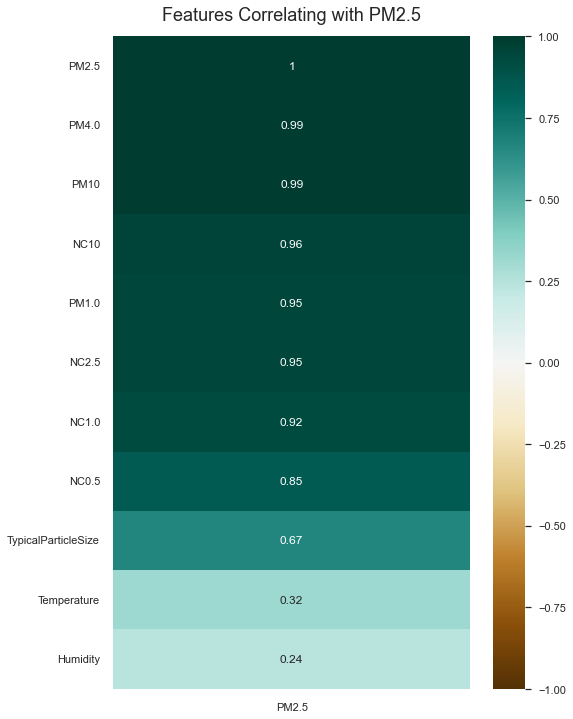

In [272]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(s_df.corr()[[param]].sort_values(by=param, ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title(f'Features Correlating with {param}', fontdict={'fontsize':18}, pad=16);

plt.savefig(f'{fig_folder}/heatmap({param}).pdf', dpi=300, bbox_inches='tight')


<ipython-input-121-98ac05787123>:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(heatmap_df.corr(), dtype=np.bool))


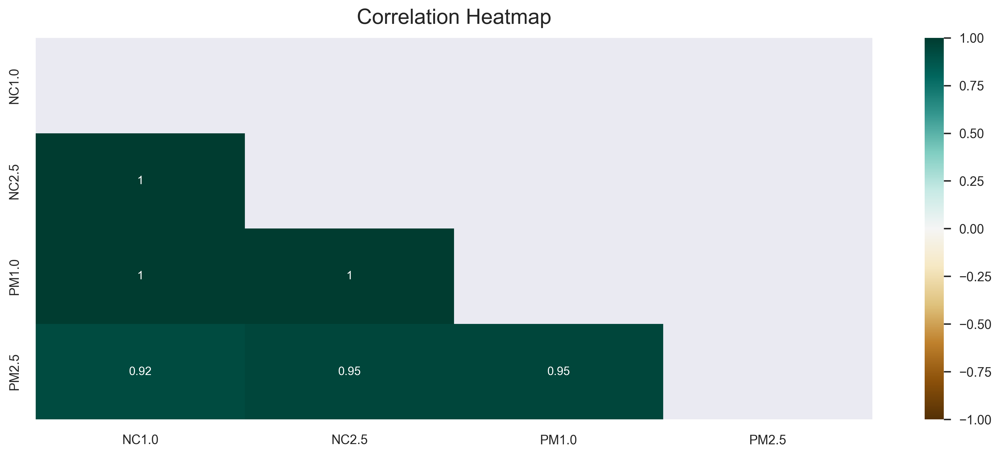

In [121]:
# USES PEARSON CORRELATION

plt.figure(figsize=(16, 6), dpi=300)

heatmap_df = s_df[['NC1.0', 'NC2.5', 'PM1.0', 'PM2.5']]
mask = np.triu(np.ones_like(heatmap_df.corr(), dtype=np.bool))

heatmap = sns.heatmap(heatmap_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig(f'{fig_folder}/heatmap_reduced.pdf', dpi=300, bbox_inches='tight')

<ipython-input-138-0f2dd989a28d>:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(heatmap_df.corr(), dtype=np.bool))


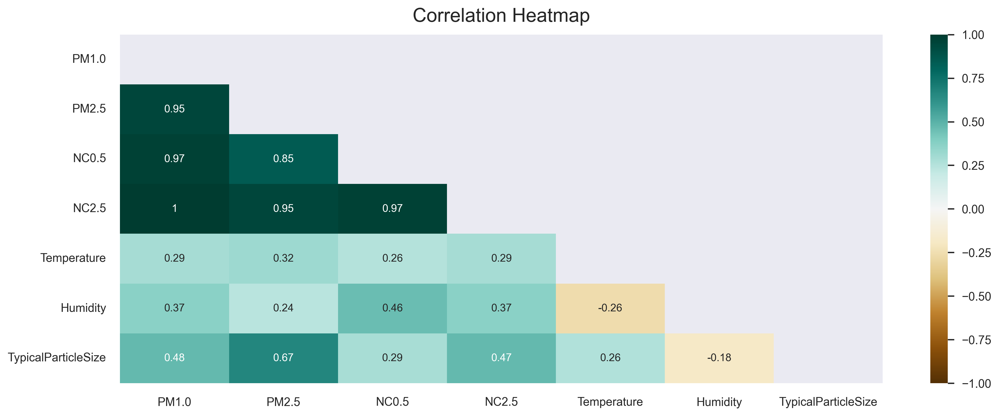

In [138]:
plt.figure(figsize=(16, 6), dpi=300)

heatmap_df = s_df[[ 'PM1.0', 'PM2.5', 'NC0.5', 'NC2.5', 'Temperature', 'Humidity', 'TypicalParticleSize']]
mask = np.triu(np.ones_like(heatmap_df.corr(), dtype=np.bool))

heatmap = sns.heatmap(heatmap_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig(f'{fig_folder}/heatmap_triangle.pdf', dpi=300, bbox_inches='tight')

In [129]:
# Correlations
print('Correlation PM2.5 with NC2.5')
print(s_df['PM2.5'].corr(s_df['NC2.5']))

print()
print('Correlation PM1.0 with NC1.0')
print(s_df['PM1.0'].corr(s_df['NC1.0']))

Correlation PM2.5 with NC2.5
0.9514185627490965

Correlation PM1.0 with NC1.0
0.9963149582027249
Correlation PM1.0 with NC1.0
0.2354185516194308


# Significant categories

## Student T-Tests

**Assumptions**

* Observations in two groups have an approximately normal distribution (Shapiro-Wilks Test)
* Homogeneity of variances (variances are equal between treatment groups) (Levene or Bartlett Test)
* The two groups are sampled independently from each other from the same population

**Two sample t-test**

The two-sample (unpaired or independent) t-test compares the means of two independent groups, determining whether they are equal or significantly different. In two sample t-test, usually, we compute the sample means from two groups and derives the conclusion for the population’s means (unknown means) from which two groups are drawn.

For example, we have two different plant genotypes (genotype A and genotype B) and would like to compare if the yield of genotype A is significantly different from genotype B

*Large sample size: n>=30 and when n1 = n2*

In [77]:
significance_level = 0.01
columns = ['Station', 'Category', 'param', 'n1', 'n2', 'p-value', 'a', 'significant difference']

### Morning vs Evening Peak time

Only **slussen** is found to have a significant difference for morning or evening period.

In [78]:
category = 'Morning vs. Evening'
test_rows = []

for station in list(s_df['Station'].unique()):

    t_df = s_df[s_df['Station'] == station]

    a = t_df.loc[t_df['Period'] == 'Morning rush', param].to_numpy()
    b = t_df.loc[t_df['Period'] == 'Evening rush', param].to_numpy()

    n1 = len(a)
    n2 = len(b)

    result = stats.ttest_ind(a=a, b=b, equal_var=True)
    significant_difference = result.pvalue < significance_level
    
    test_rows.append([station, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

/opt/homebrew/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Station,Category,param,n1,n2,p-value,a,significant difference
0,Islandstorget,Morning vs. Evening,PM2.5,2,1,NaN,0.01,False
1,Angbyplan,Morning vs. Evening,PM2.5,1,1,NaN,0.01,False
2,Åkeshov,Morning vs. Evening,PM2.5,2,3,0.988425,0.01,False
3,Brommaplan,Morning vs. Evening,PM2.5,3,5,0.407078,0.01,False
4,Abrahamsberg,Morning vs. Evening,PM2.5,3,5,0.469454,0.01,False
5,Stora mossen,Morning vs. Evening,PM2.5,3,6,0.458987,0.01,False
6,Alvik,Morning vs. Evening,PM2.5,8,7,0.619241,0.01,False
7,Kristineberg,Morning vs. Evening,PM2.5,8,7,0.446485,0.01,False
8,Thorildsplan,Morning vs. Evening,PM2.5,6,6,0.669189,0.01,False
9,Fridhemsplan,Morning vs. Evening,PM2.5,8,8,0.084064,0.01,False


### Peak vs. offpeak

Only **Thorildsplan** is found to have a significant difference for morning or evening period.

In [79]:
category = 'Peak vs. offpeak'
test_rows = []

for station in list(s_df['Station'].unique()):

    t_df = s_df[s_df['Station'] == station]

    a = t_df.loc[t_df['Period'].isin(['Morning rush', 'Evening rush']), param].to_numpy()
    b = t_df.loc[t_df['Period'] == 'Offtime', param].to_numpy()

    n1 = len(a)
    n2 = len(b)

    result = stats.ttest_ind(a=a, b=b, equal_var=True)
    significant_difference = result.pvalue < significance_level
    
    test_rows.append([station, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

/opt/homebrew/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Station,Category,param,n1,n2,p-value,a,significant difference
0,Islandstorget,Peak vs. offpeak,PM2.5,3,1,NaN,0.01,False
1,Angbyplan,Peak vs. offpeak,PM2.5,2,0,NaN,0.01,False
2,Åkeshov,Peak vs. offpeak,PM2.5,5,4,0.210090,0.01,False
3,Brommaplan,Peak vs. offpeak,PM2.5,8,3,0.352947,0.01,False
4,Abrahamsberg,Peak vs. offpeak,PM2.5,8,3,0.346159,0.01,False
5,Stora mossen,Peak vs. offpeak,PM2.5,9,2,0.252984,0.01,False
6,Alvik,Peak vs. offpeak,PM2.5,15,5,0.077163,0.01,False
7,Kristineberg,Peak vs. offpeak,PM2.5,15,5,0.080278,0.01,False
8,Thorildsplan,Peak vs. offpeak,PM2.5,12,5,0.046852,0.01,False
9,Fridhemsplan,Peak vs. offpeak,PM2.5,16,4,0.104278,0.01,False


### Outside vs. inside

There is a significant difference between outside and inside stations.

In [80]:
category = 'Outside vs. inside'
inside_stations = [
    'Fridhemsplan', 
    'St Eriksplan', 
    'Odenplan', 
    'Rådmansgatan', 
    'Hötorget', 
    'T-Centralen', 
    'Slussen', 
    'Medborgarplatsen',
    'Skanstull'
]

test_rows = []

a = s_df.loc[s_df['Station'].isin(inside_stations), param].to_numpy()
b = s_df.loc[~s_df['Station'].isin(inside_stations), param].to_numpy()

n1 = len(a)
n2 = len(b)

result = stats.ttest_ind(a=a, b=b, equal_var=True)
significant_difference = result.pvalue < significance_level

test_rows.append([station, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

,Station,Category,param,n1,n2,p-value,a,significant difference
0,Gullmarsplan,Outside vs. inside,PM2.5,169,138,1.054937e-78,0.01,True


### Before 12.00 and after 12.00

Only slussen has a significant difference regarding time.

In [81]:
category = 'BeforeNoonvsAfterNoon'
test_rows = []

for station in list(s_df['Station'].unique()):

    t_df = s_df[s_df['Station'] == station]

    a = t_df.loc[t_df['Time'] <= '12:00:00', param].to_numpy()
    b = t_df.loc[t_df['Time'] > '12:00:00', param].to_numpy()

    n1 = len(a)
    n2 = len(b)

    result = stats.ttest_ind(a=a, b=b, equal_var=True)
    significant_difference = result.pvalue < significance_level
    
    test_rows.append([station, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

/opt/homebrew/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Station,Category,param,n1,n2,p-value,a,significant difference
0,Islandstorget,BeforeNoonvsAfterNoon,PM2.5,2,2,0.193179,0.01,False
1,Angbyplan,BeforeNoonvsAfterNoon,PM2.5,1,1,NaN,0.01,False
2,Åkeshov,BeforeNoonvsAfterNoon,PM2.5,2,7,0.555805,0.01,False
3,Brommaplan,BeforeNoonvsAfterNoon,PM2.5,3,8,0.210587,0.01,False
4,Abrahamsberg,BeforeNoonvsAfterNoon,PM2.5,3,8,0.260123,0.01,False
5,Stora mossen,BeforeNoonvsAfterNoon,PM2.5,3,8,0.275936,0.01,False
6,Alvik,BeforeNoonvsAfterNoon,PM2.5,10,10,0.551313,0.01,False
7,Kristineberg,BeforeNoonvsAfterNoon,PM2.5,10,10,0.391222,0.01,False
8,Thorildsplan,BeforeNoonvsAfterNoon,PM2.5,8,9,0.623880,0.01,False
9,Fridhemsplan,BeforeNoonvsAfterNoon,PM2.5,10,10,0.416236,0.01,False


### First halv measuring period vs second measuring period half

In [82]:
category = 'DateSplit'
test_rows = []

for station in list(s_df['Station'].unique()):

    t_df = s_df[s_df['Station'] == station]

    a = t_df.loc[t_df['Date'] <= '2021-10-05', param].to_numpy()
    b = t_df.loc[t_df['Date'] > '2021-10-05', param].to_numpy()

    n1 = len(a)
    n2 = len(b)

    result = stats.ttest_ind(a=a, b=b, equal_var=True)
    significant_difference = result.pvalue < significance_level
    
    test_rows.append([station, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

/opt/homebrew/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Station,Category,param,n1,n2,p-value,a,significant difference
0,Islandstorget,DateSplit,PM2.5,2,2,0.466388,0.01,False
1,Angbyplan,DateSplit,PM2.5,1,1,NaN,0.01,False
2,Åkeshov,DateSplit,PM2.5,6,3,0.196698,0.01,False
3,Brommaplan,DateSplit,PM2.5,6,5,0.559024,0.01,False
4,Abrahamsberg,DateSplit,PM2.5,6,5,0.478726,0.01,False
5,Stora mossen,DateSplit,PM2.5,6,5,0.450122,0.01,False
6,Alvik,DateSplit,PM2.5,9,11,0.770592,0.01,False
7,Kristineberg,DateSplit,PM2.5,9,11,0.673735,0.01,False
8,Thorildsplan,DateSplit,PM2.5,7,10,0.284887,0.01,False
9,Fridhemsplan,DateSplit,PM2.5,9,11,0.116540,0.01,False


### Diff between stations

Interesting points:
* There is no significant difference between Hötorget, T-Centralen, and Rådmansgatan. Can regard all of them as being the three stations with highest values. However, we can still perform our focused efforts on Hötorget.

/opt/homebrew/lib/python3.9/site-packages/statsmodels/sandbox/stats/multicomp.py:793: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(np.insert(self.groupsunique.astype(str), 0, ''))


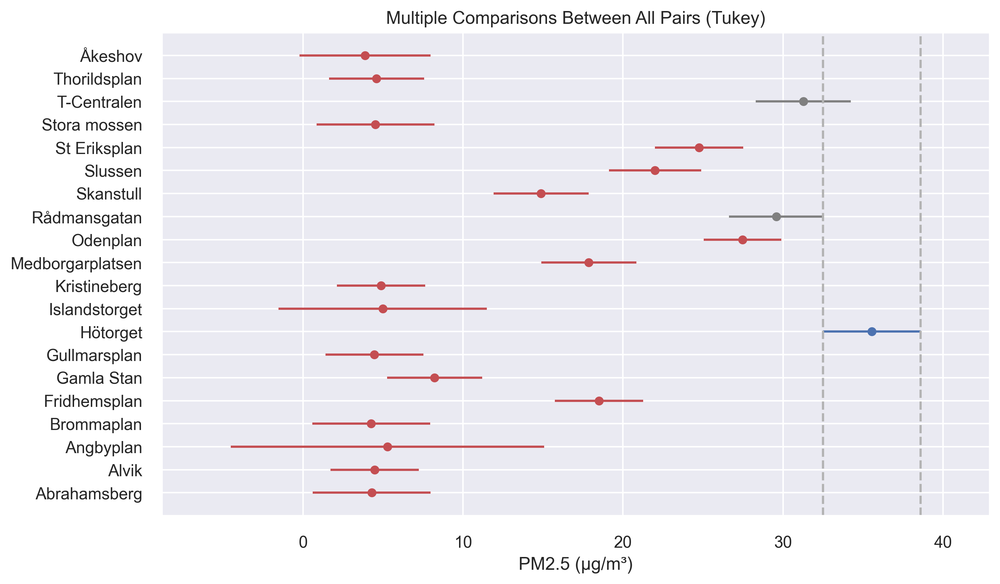

In [83]:
tukey = pairwise_tukeyhsd(
    endog=s_df[param],
    groups=s_df['Station'],
    alpha=0.05
)

#tukey.summary()

fig, ax = plt.subplots(dpi=300)

tukey.plot_simultaneous(
    comparison_name='Hötorget', 
    ax=ax,
    xlabel=f'{param} ({unit})'
)

plt.savefig(f'{fig_folder}/tukey_comparisons_stations({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

In [84]:
station_order = list(s_df['Station'].unique())
alphabet = list('abcdefghijklmnopqrstuvwxyz')

station_order

tukey_s_df = s_df.copy()

tukey_s_df['Station'] = s_df['Station'].apply(lambda x: f'{alphabet[station_order.index(x)]}. {x}')

#tukey_s_df[tukey_s_df['Station'] == 'b. Angbyplan']['Station'] = 'b. Ängbyplan'

In [85]:
tukey_s_df['Station'].unique()

array(['a. Islandstorget', 'b. Angbyplan', 'c. Åkeshov', 'd. Brommaplan',
       'e. Abrahamsberg', 'f. Stora mossen', 'g. Alvik',
       'h. Kristineberg', 'i. Thorildsplan', 'j. Fridhemsplan',
       'k. St Eriksplan', 'l. Odenplan', 'm. Rådmansgatan', 'n. Hötorget',
       'o. T-Centralen', 'p. Gamla Stan', 'q. Slussen',
       'r. Medborgarplatsen', 's. Skanstull', 't. Gullmarsplan'],
      dtype=object)

/opt/homebrew/lib/python3.9/site-packages/statsmodels/sandbox/stats/multicomp.py:793: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels(np.insert(self.groupsunique.astype(str), 0, ''))


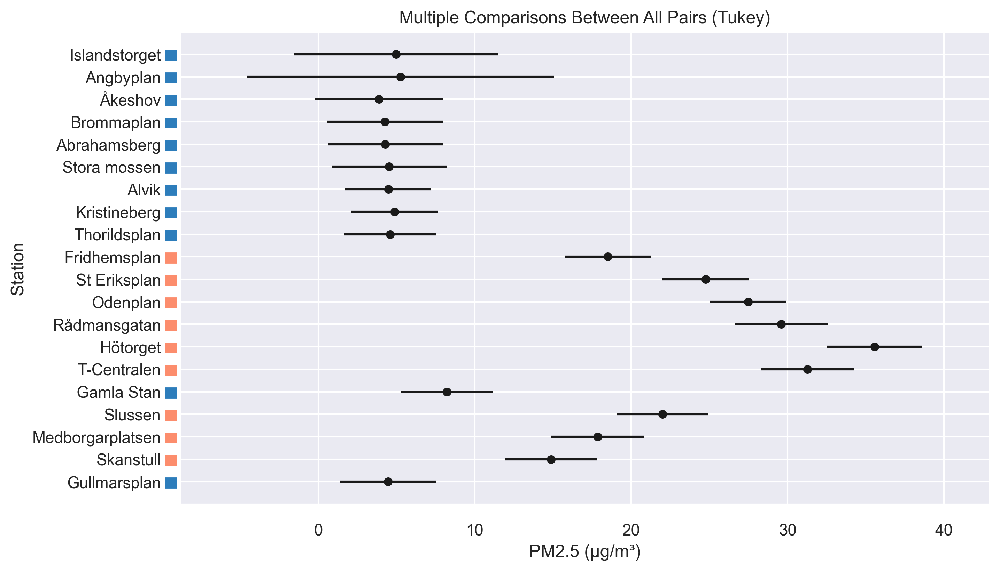

In [102]:
import time
tukey = pairwise_tukeyhsd(
    endog=tukey_s_df[param],
    groups=tukey_s_df['Station'],
    alpha=0.05
)

fig, ax = plt.subplots(dpi=300)

tukey.plot_simultaneous(
    #comparison_name='Alvik', 
    ax=ax,
    xlabel=f'{param} ({unit})',
    ylabel='Station'
)

plt.gca().invert_yaxis()
#plt.ylim(['Odenplan', 'Islandstorget'])

# Change color of xticks
inside_c = '#FB6237'
outside_c = '#246394'

plt.draw()

labels = [item.get_text()[3:] for item in ax.get_yticklabels()]
ax.set_yticklabels(labels)

#print(ax.yaxis.get_ticklabels()[1].get_text()[3:])

#[t.set_color(inside_c) for t in ax.yaxis.get_ticklabels()]
#[t.set_color(outside_c) for t in ax.yaxis.get_ticklabels() if t.get_text() in get_outside_stations()]

inside_c = '#FC8D6D'
outside_c = '#2D7DBB'

i = 0
for t in ax.yaxis.get_ticklabels():
    
    if t.get_text() == '': continue
        
    c = inside_c if t.get_text() in get_inside_stations() else outside_c
    
    ax.text(
        -9.5, i + 0.055, 
        ' ',
        fontsize = 2, 
        zorder = 6, 
        color = 'k', 
        rotation=90, 
        bbox={'facecolor': c, 'pad':4}
    )
    
    i += 1

plt.savefig(f'{fig_folder}/tukey_comparisons_all_color({param}).pdf', dpi=300, bbox_inches="tight")
plt.show()

In [111]:
# TUKEY SUMMARY
tukey.summary()

group1,group2,meandiff,p-adj,lower,upper,reject
Abrahamsberg,Alvik,0.1798,0.9,-6.2942,6.6539,False
Abrahamsberg,Angbyplan,0.9757,0.9,-12.282,14.2334,False
Abrahamsberg,Brommaplan,-0.0294,0.9,-7.3834,7.3246,False
Abrahamsberg,Fridhemsplan,14.211,0.001,7.737,20.6851,True
Abrahamsberg,Gamla Stan,3.9306,0.8268,-2.7431,10.6042,False
Abrahamsberg,Gullmarsplan,0.1715,0.9,-6.5836,6.9266,False
Abrahamsberg,Hötorget,31.2639,0.001,24.5088,38.019,True
Abrahamsberg,Islandstorget,0.6886,0.9,-9.3813,10.7586,False
Abrahamsberg,Kristineberg,0.5894,0.9,-5.8847,7.0634,False
Abrahamsberg,Medborgarplatsen,13.5711,0.001,6.8974,20.2447,True


In [115]:
with open(f'{fig_folder}/tables/tukey_summary_{param}.txt', 'w') as f:
    f.write(str(tukey.summary()))

In [114]:
#results_as_html = tukey.summary().as_html()
#pd.read_html(results_as_html, header=0, index_col=0)[0]

In [100]:
type(tukey.summary())

statsmodels.iolib.table.SimpleTable

# Investigate lack of normality

In [25]:
station = 'Alvik'

s_i_df = s_df[s_df['Station'] == station]
r_i_df = r_df[r_df['Station'] == station]

s_i_df['Timestamp'] = s_i_df['Timestamp'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d %H:%M:%S"))
r_i_df['Timestamp'] = r_i_df['Timestamp'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d %H:%M:%S"))

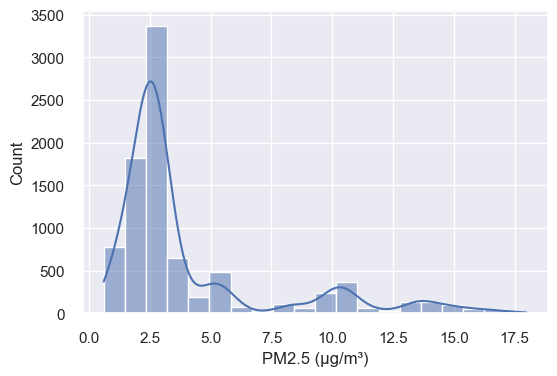

In [26]:
# Look at distribution of PM
fig, ax = plt.subplots(figsize=[6,4], dpi=100)

sns.histplot(r_i_df, x=param, kde=True, bins=20)
plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')

plt.show()

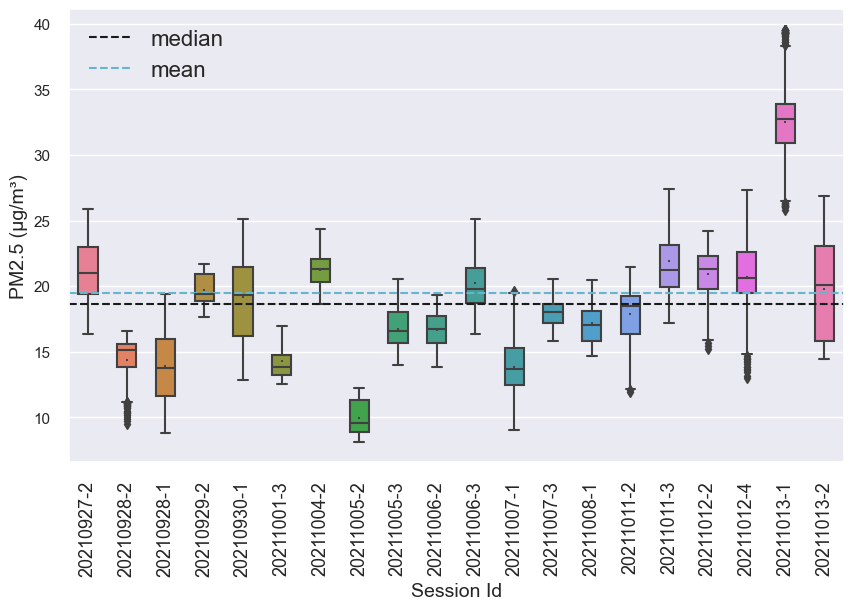

In [18]:
# Look at individual sessions of PM
fig, ax = plt.subplots(figsize=[10,6], dpi=100)

sns.boxplot(
    x='Session Id', 
    y=param, 
    data=r_i_df.sort_values(by=['Timestamp']), 
    width=0.5, 
    palette='husl',  
    showmeans=True,
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })

plt.axhline(r_i_df[param].median(), c='k', linestyle='--', label='median')
plt.axhline(r_i_df[param].mean(), c='c', linestyle='--', label='mean')

plt.xticks(rotation=90, fontsize=13)
plt.legend(fontsize=16)
plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Session Id', fontsize=14)

plt.show()

In [348]:
len(r_i_df['Session Id'].unique())

16

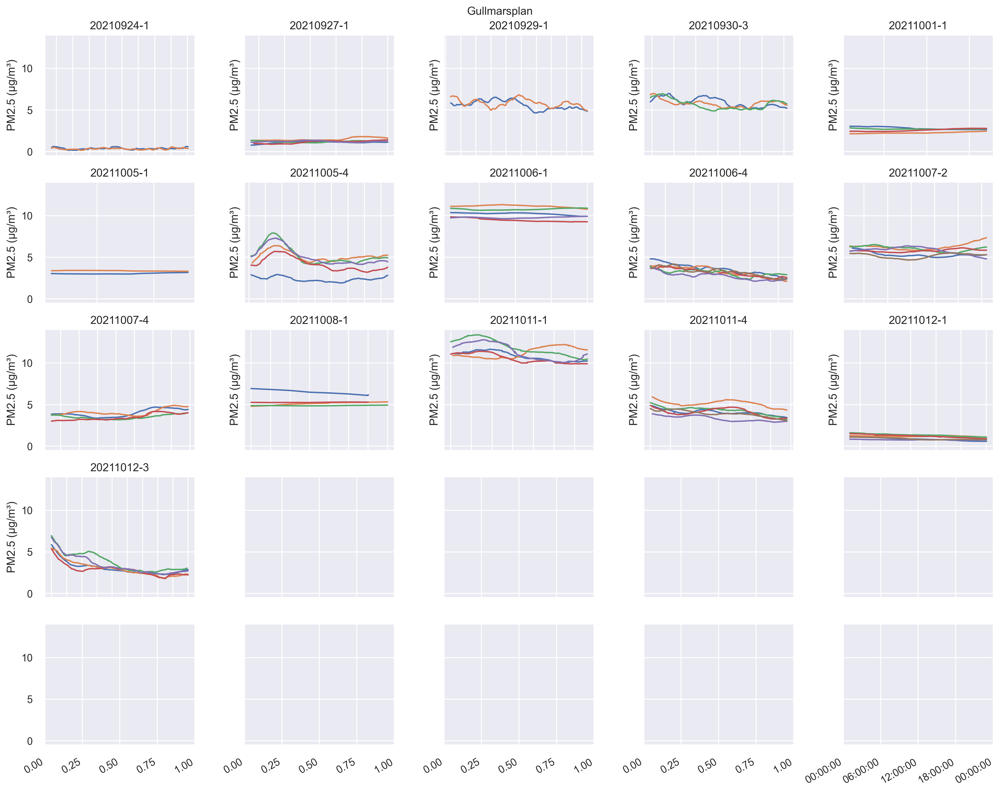

In [349]:
# Look at the actual session and see what happens
fig, axs = plt.subplots(dpi=300, figsize = (15,12), ncols=5, nrows=5, sharey=True, sharex=False)

for session_id, ax in zip(r_i_df.sort_values(by=['Timestamp'])['Session Id'].unique(), axs.flatten()):
    
    ax_df = r_i_df[r_i_df['Session Id'] == session_id].sort_values(by=['Timestamp'])
    
    mean_df = ax_df.groupby('Timestamp').mean()
    mean_df['Timestamp'] = mean_df.index
    mean_df['Sensor'] = 'Mean'
    mean_df['UID'] = 'Mean'

    mean_df.reset_index(drop=True, inplace=True)
    
    for sensor, grp in ax_df.groupby('Sensor'):
        ax.plot(grp['Timestamp'], grp[param], label=f'Sensor {sensor}')
    
    # Plot mean
    # ax.plot(mean_df['Timestamp'], mean_df[param], label='Mean', c='k', linewidth=2)
   
    # Label axis
    ax.set_xlabel('Timestamp')
    ax.set_ylabel(f'{param} ({unit})')
    ax.set_title(session_id)

plt.suptitle(station) 
    
# Format time on x-axis
plt.gcf().autofmt_xdate()
myFmt = dates.DateFormatter('%H:%M:%S')
plt.gca().xaxis.set_major_formatter(myFmt)

plt.tight_layout()

plt.show()


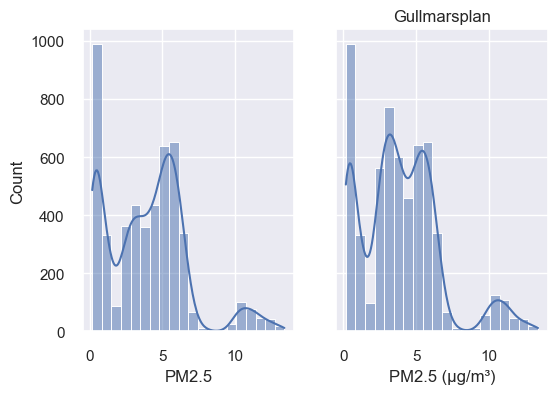

In [350]:
# Look at distribution of PM
fig, axs = plt.subplots(figsize=[6,4], dpi=100, ncols=2, nrows=1, sharey=True, sharex=True)

# Exclude 10-04
r_i_df['Date'] = r_i_df['Timestamp'].apply(lambda x: str(x.date()))
plot_df = r_i_df[(r_i_df['Date'] != '2021-10-04') & (r_i_df['Date'] != '2021-10-06')]

sns.histplot(plot_df, x=param, kde=True, bins=20, ax=axs[0])
sns.histplot(r_i_df, x=param, kde=True, bins=20, ax=axs[1])

plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')
plt.title(station)

plt.show()

# Split in middle

In [351]:
significance_level = 0.01
columns = ['Session Id', 'Category', 'param', 'n1', 'n2', 'p-value', 'a', 'significant difference']

category = 'RawStationSplit'
test_rows = []

for session_id in list(r_i_df.sort_values(by=['Timestamp'])['Session Id'].unique()):

    t_df = r_i_df[r_i_df['Session Id'] == session_id]
    
    middle_time = get_middle_value(t_df, 'Timestamp')

    a = t_df.loc[t_df['Timestamp'] < middle_time]
    a = a.groupby('Timestamp')[param].mean().to_numpy()

    b = t_df.loc[t_df['Timestamp'] >= middle_time]
    b = b.groupby('Timestamp')[param].mean().to_numpy()

    n1 = len(a)
    n2 = len(b)

    result = stats.ttest_ind(a=a, b=b, equal_var=True)
    significant_difference = result.pvalue < significance_level
    
    test_rows.append([session_id, category, param, n1, n2, result.pvalue, significance_level, significant_difference])

test_df = pd.DataFrame(test_rows, columns=columns)
#test_df.to_csv(f'{fig_folder}/tables/t_test_{category}({param}).csv')

test_df

,Session Id,Category,param,n1,n2,p-value,a,significant difference
0,20210924-1,RawStationSplit,PM2.5,250,251,1.117486e-01,0.01,False
1,20210927-1,RawStationSplit,PM2.5,27,27,2.901488e-09,0.01,True
2,20210929-1,RawStationSplit,PM2.5,135,137,1.135145e-28,0.01,True
3,20210930-3,RawStationSplit,PM2.5,93,94,6.293299e-27,0.01,True
4,20211001-1,RawStationSplit,PM2.5,8,9,5.887229e-01,0.01,False
5,20211005-1,RawStationSplit,PM2.5,6,7,5.132376e-01,0.01,False
6,20211005-4,RawStationSplit,PM2.5,62,63,9.883998e-18,0.01,True
7,20211006-1,RawStationSplit,PM2.5,10,10,1.911546e-01,0.01,False
8,20211006-4,RawStationSplit,PM2.5,73,73,7.076991e-45,0.01,True
9,20211007-2,RawStationSplit,PM2.5,29,30,1.775933e-02,0.01,False


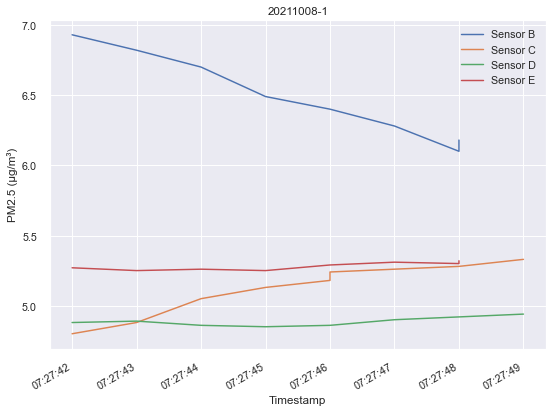

In [352]:
# One session
session_id = '20211008-1'

# Look at the actual session and see what happens
fig, ax = plt.subplots(dpi=70, figsize = (8,6))

for sensor, grp in r_i_df[r_i_df['Session Id'] == session_id].sort_values(by=['Timestamp']).groupby('Sensor'):
    ax.plot(grp['Timestamp'], grp[param], label=f'Sensor {sensor}')

# Label axis
ax.set_xlabel('Timestamp')
ax.set_ylabel(f'{param} ({unit})')
ax.set_title(session_id)
ax.legend()

# Format time on x-axis
plt.gcf().autofmt_xdate()
myFmt = dates.DateFormatter('%H:%M:%S')
plt.gca().xaxis.set_major_formatter(myFmt)

plt.tight_layout()

plt.show()


# Inside outside trends

In [353]:
inside_stations = [
    'Fridhemsplan', 
    'St Eriksplan', 
    'Odenplan', 
    'Rådmansgatan', 
    'Hötorget', 
    'T-Centralen', 
    'Slussen', 
    'Medborgarplatsen',
    'Skanstull'
]

trend_df = r_df.copy()
trend_df['Inside'] = trend_df['Station'].apply(lambda x: x in inside_stations)

In [354]:
inside_df = trend_df[trend_df['Inside'] == True]
outside_df = trend_df[trend_df['Inside'] == False]

2.1241603814747863


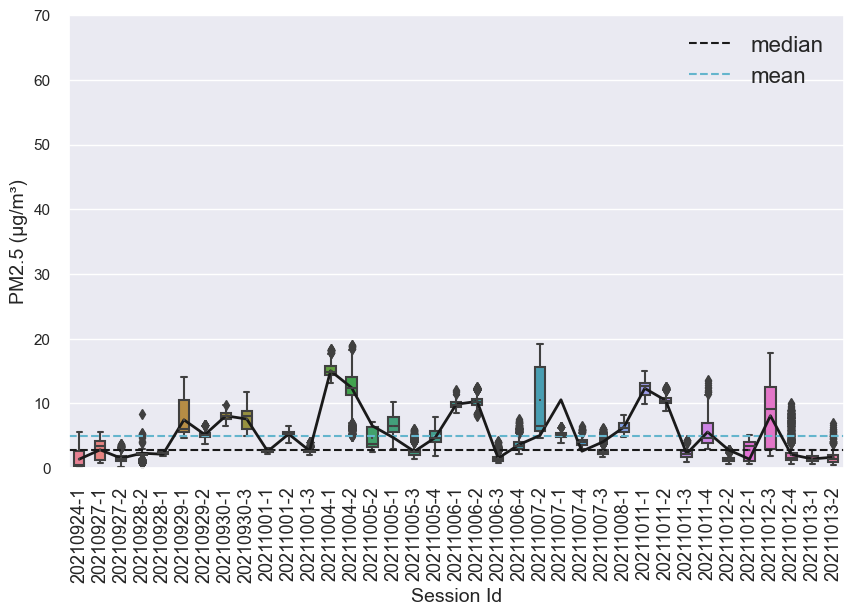

In [360]:
# Look at individual sessions of PM
fig, ax = plt.subplots(figsize=[10,6], dpi=100)

o_means = []
o_session_ids = []

for session_id, grp in outside_df.groupby('Session Id'):
    o_means.append(grp[param].mean())
    o_session_ids.append(session_id)

sns.boxplot(
    x='Session Id', 
    y=param, 
    data=outside_df.sort_values(by=['Timestamp']), 
    width=0.5, 
    palette='husl',  
    showmeans=True,
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })

plt.axhline(outside_df[param].median(), c='k', linestyle='--', label='median')
plt.axhline(outside_df[param].mean(), c='c', linestyle='--', label='mean')

plt.plot(o_session_ids, o_means, c='k', linewidth=2)

plt.xticks(rotation=90, fontsize=13)
plt.legend(fontsize=16)
plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Session Id', fontsize=14)

plt.ylim([0,70])

print(abs(outside_df[param].mean() - outside_df[param].median()))

plt.show()

0.34450037549144596


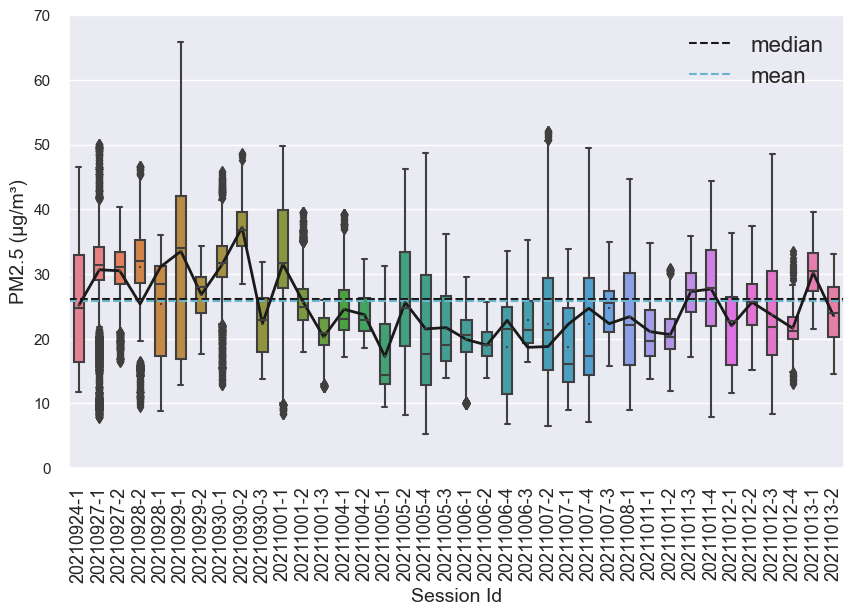

In [361]:
# Look at individual sessions of PM
fig, ax = plt.subplots(figsize=[10,6], dpi=100)

i_means = []
i_session_ids = []

for session_id, grp in inside_df.groupby('Session Id'):
    i_means.append(grp[param].mean())
    i_session_ids.append(session_id)

sns.boxplot(
    x='Session Id', 
    y=param, 
    data=inside_df.sort_values(by=['Timestamp']), 
    width=0.5, 
    palette='husl',  
    showmeans=True,
    meanprops={"marker": 's',
                "markerfacecolor":"#444", 
                "markersize":"2"
    })

plt.axhline(inside_df[param].median(), c='k', linestyle='--', label='median')
plt.axhline(inside_df[param].mean(), c='c', linestyle='--', label='mean')

plt.plot(i_session_ids, i_means, c='k', linewidth=2)

plt.xticks(rotation=90, fontsize=13)
plt.legend(fontsize=16)
plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Session Id', fontsize=14)

plt.ylim([0,70])

print(abs(inside_df[param].mean() - inside_df[param].median()))

plt.show()



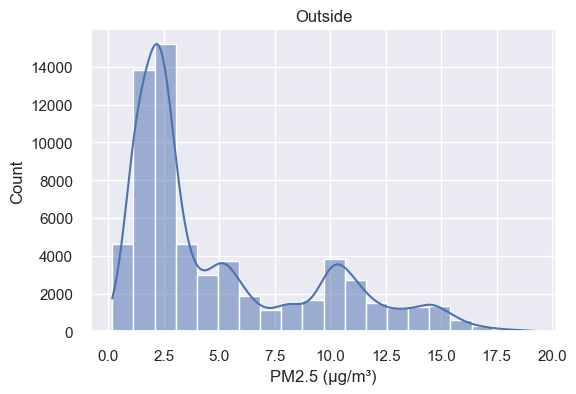

In [362]:
# Look at distribution of PM
fig, ax = plt.subplots(figsize=[6,4], dpi=100)

# Exclude 10-04
outside_df['Date'] = outside_df['Timestamp'].apply(lambda x: x[:10])
plot_outside_df = outside_df[outside_df['Date'] != '2021-10-04']

sns.histplot(outside_df, x=param, kde=True, bins=20)
plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')
plt.title('Outside')

plt.show()

In [504]:
# peak


Session Id                      20210930-1
Timestamp              2021-09-30 07:30:12
Period                        Morning rush
Station                              Alvik
Sensors                                 2B
NC0.5                            53.302517
NC1.0                            61.848411
NC2.5                            62.015298
NC10                             62.046225
TypicalParticleSize               0.510199
PM1.0                             7.770795
PM2.5                              8.21755
PM4.0                              8.21755
PM10                               8.21755
Temperature                      20.913245
Humidity                         46.196026
Date                            2021-09-30
Time                              07:30:12
Station Order                        Alvik
Name: 65, dtype: object

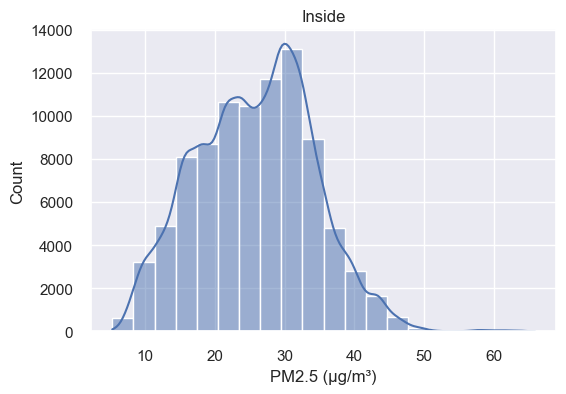

In [217]:
# Look at distribution of PM
fig, ax = plt.subplots(figsize=[6,4], dpi=100)

sns.histplot(inside_df, x=param, kde=True, bins=20)
plt.ylabel('Count')
plt.xlabel(f'{param} ({unit})')
plt.title('Inside')

plt.show()

In [515]:
20 - len(inside_stations)

11

In [516]:
# 10-04: 
# Outside stations: 7 of 11

maxes = {}

for station, grp in s_df.groupby('Station'):
    
    
    date = grp[grp['PM2.5'] == grp['PM2.5'].max()]['Date'].values[0]
    
    if date not in maxes:
        maxes[date] = []
        
    maxes[date].append(station)
    
maxes

{'2021-10-04': ['Abrahamsberg',
  'Alvik',
  'Brommaplan',
  'Kristineberg',
  'Stora mossen',
  'Thorildsplan',
  'Åkeshov'],
 '2021-09-30': ['Angbyplan', 'Skanstull'],
 '2021-10-13': ['Fridhemsplan'],
 '2021-10-07': ['Gamla Stan'],
 '2021-10-11': ['Gullmarsplan'],
 '2021-09-29': ['Hötorget', 'Medborgarplatsen', 'Rådmansgatan', 'Slussen'],
 '2021-10-06': ['Islandstorget'],
 '2021-09-28': ['Odenplan', 'St Eriksplan'],
 '2021-10-01': ['T-Centralen']}

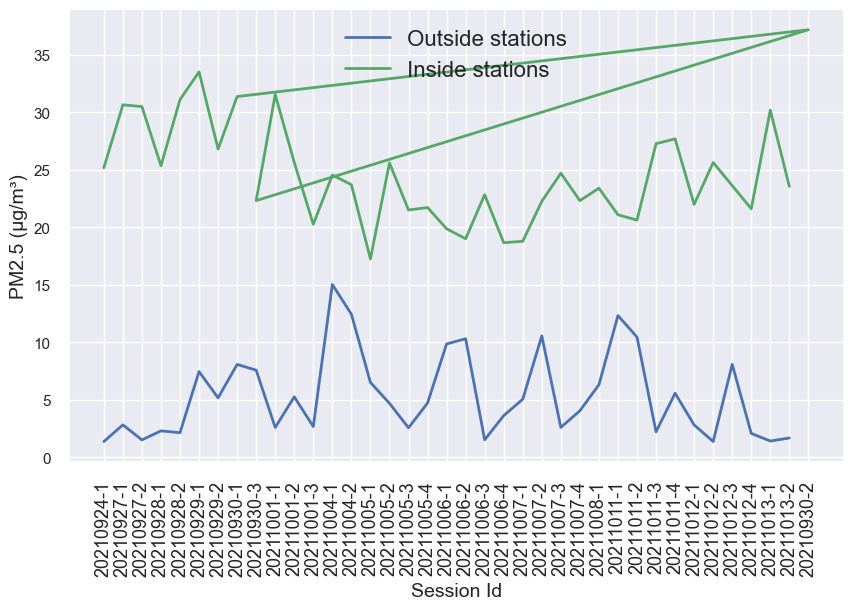

In [119]:
# Comparisons means

fig, ax = plt.subplots(figsize=[10,6], dpi=100)

plt.plot(o_session_ids, o_means, c='b', linewidth=2, label='Outside stations')
plt.plot(i_session_ids, i_means, c='g', linewidth=2, label='Inside stations')

plt.xticks(rotation=90, fontsize=13)
plt.legend(fontsize=16)
plt.ylabel(fr"{param} ({unit})", fontsize=14)
plt.xlabel('Session Id', fontsize=14)

plt.show()


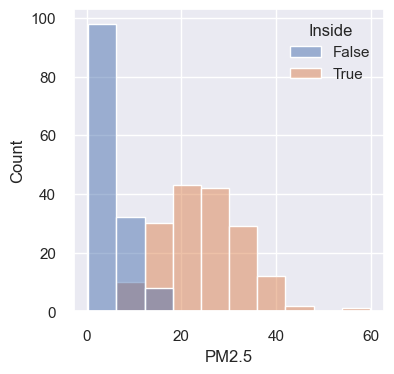

In [35]:

fig, ax = plt.subplots(figsize=[4,4], dpi=100)

#sns.histplot(diffs, kde=True)
sns.histplot(dist_df, x='PM2.5', hue='Inside', legend=True)

#plt.axvline(0, linestyle='--', c='#999')

#plt.savefig(f'{fig_folder}/kde_plot_diffs({param}).pdf', dpi=300, bbox_inches="tight")

plt.show()

# Other MISC

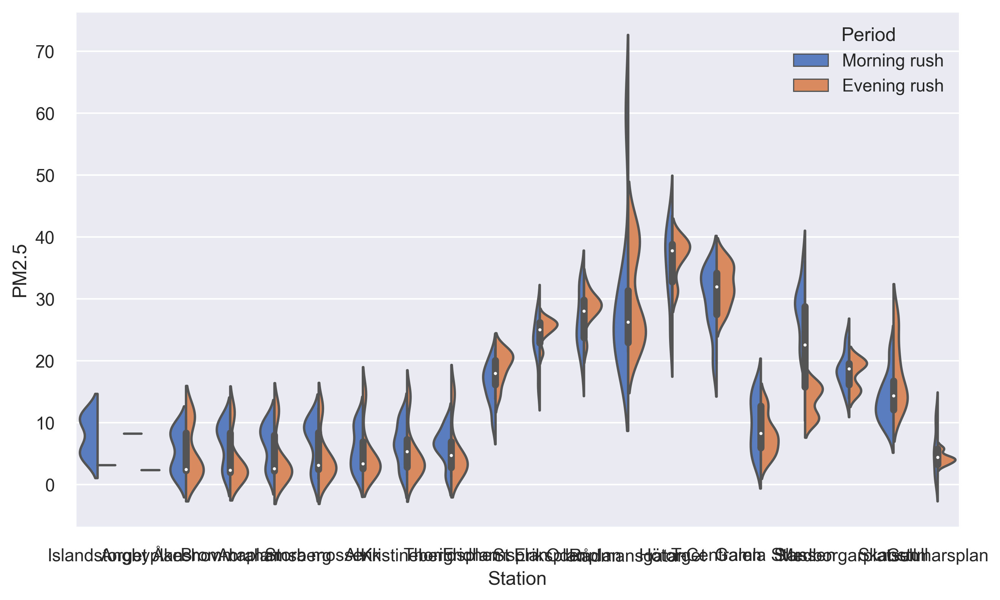

In [7]:
plot_df = s_df[s_df['Period'].isin(['Morning rush', 'Evening rush'])]

fig, ax = plt.subplots(figsize=[10, 6], dpi=300)

ax = sns.violinplot(x="Station", y=param, hue='Period',
                    data=plot_df, palette="muted", split=True, bw=.5)

# OUTLIER SESSION

In [60]:
################################
# HELPER FUNCTIONS
################################

def load_sessions(filename):
    with open(filename, 'r') as f:     
        sessions = json.loads(f.read())
        
    return sessions

def save_sessions(filename, sessions):
    with open(filename, 'w') as f:
        json.dump(sessions, f, default=str)

def get_placetime_df(pts_df, date, route, period):
    # Get data for that that date and period
    sub_df = pts_df[(pts_df['date'] == date) & (pts_df['period'] == period)]

    # Associate information
    pt_df = sub_df[(sub_df['route'] == route) & (sub_df['period'] == period)]
    pt_df = pt_df.sort_values('start')
    pt_df = pt_df.drop('mode', 1)
    
    return pt_df

def get_sensor_dfs(date, sensors, period):
    # Load data
    dfs = []
    labels = []

    dir_files = os.listdir(f'../data/sensor_data/{date}/')
    data_files = []
    
    for file in dir_files:
        if (file[0] in sensors) and (file.endswith(f'{period}.csv')):
            data_files.append(file)

    data_files.sort()        

    # Add timestamps column
    for file in data_files:
        df = pd.read_csv(f'../data/sensor_data/{date}/{file}', skiprows=1)
        df['Timestamp'] = df['Time'].apply(lambda x: format_time(date, x) + timedelta(hours=2))

        # Add label column
        df['Sensor'] = file[0]

        dfs.append(df)

        labels.append(file.split('-')[0])
        
    return dfs, labels, data_files

def plot_sensors(date, dfs, labels, pt_df, offsets = (0, 0), filename=None):
    # Plot to determine route
    fig, ax = plt.subplots(dpi=200, figsize = (10, 5))

    for i, df in enumerate(dfs):
        ax.plot(df['Timestamp'], df['PM2.5'], label=f'Sensor {labels[i]}')

    # Label axis
    ax.set_title(date, fontsize=25)
    ax.set_xlabel('time')
    ax.set_ylabel('PM 2.5')

    colors = ['k', 'm', 'b', 'g', 'c', 'y', 'darkorange', 'seagreen', 'royalblue', 'lightcoral', 'sandybrown', 'powderblue', 'violet', 'lawngreen', 'firebrick', 'khaki', 'darkmagenta']
    
    # Plot start and stop as vertical lines
    i = 0
    for index, row in pt_df.iterrows():
        
        # Check if lines need offsetting
        o1, o2 = offsets
        plt.axvline(x=get_timestamp(row['start'], date, o1), color=colors[i])
        plt.axvline(x=get_timestamp(row['stop'], date, o2), color=colors[i])
        
        i += 1
        
        ax.text(get_timestamp(row['start'], date), 25, row['station'], fontsize=12)

    # Format time on x-axis
    plt.gcf().autofmt_xdate()
    myFmt = dates.DateFormatter('%H:%M:%S')
    plt.gca().xaxis.set_major_formatter(myFmt)
    
    if not filename == None:
        plt.savefig(filename)

    plt.show()
    
def get_station_chunks(date, station, start, stop, pt_df, sensor_dfs, offsets = (0, 0)):
    # Get station record
    s_df = pt_df[pt_df['station'] == station].iloc[0]
        
    # Get start and stop as time objects
    start = datetime.strptime(f'{date} {s_df["start"]}', '%Y-%m-%d %H:%M:%S')
    stop = datetime.strptime(f'{date} {s_df["stop"]}', '%Y-%m-%d %H:%M:%S')
    
    # Add offsets
    o1, o2 = offsets
    start += timedelta(seconds=o1)
    stop += timedelta(seconds=o2)
    
    # Get all records for sensor that falls within range
    station_chunks = []
    
    for s_df in sensor_dfs:
        filtered = s_df[(s_df['Timestamp'] >= start) & (s_df['Timestamp'] <= stop)]
        
        # Add date and station columns
        filtered['Station'] = station
        
        # Order columns in following order
        chunk = filtered[['Timestamp', 'Station', 'Sensor', 'Temperature', 'Humidity', 'NC0.5', 'NC1.0', 'NC2.5', 'NC10', 'TypicalParticleSize', 'PM1.0', 'PM2.5', 'PM4.0', 'PM10']]
        
        # Remove old index column
        chunk.reset_index(drop=True, inplace=True)
        
        # Add to total station chunks!
        station_chunks.append(chunk)
        
    return station_chunks

def get_session_chunk(date, start, stop, pt_df, sensor_dfs, offsets = (0, 0)):
    # Get station chunks
    o1, o2 = offsets

    # All station chunks
    session_chunks = []

    for index, row in pt_df.iterrows():
        start = get_timestamp(row['start'], row['date'], o1)
        stop = get_timestamp(row['stop'], row['date'], o2)

        # Get station dataframe and convert into arrays
        print(row['station'])
        station_chunks = get_station_chunks(date, row['station'], start, stop, pt_df, sensor_dfs, OFFSETS)

        # Combine station_chunks into session chunk
        station_chunk = pd.concat(station_chunks)

        # Sort by column
        station_chunk = station_chunk.sort_values(by=['Timestamp', 'Sensor'], ascending=[True, True])

        # Remove old index column
        station_chunk.reset_index(drop=True, inplace=True)

        session_chunks.append(station_chunk)

    # Combine
    session_chunk = pd.concat(session_chunks)

    # Sort by column
    #session_chunk = session_chunk.sort_values(by=['Timestamp'], ascending=[True])

    # Remove old index column
    session_chunk.reset_index(drop=True, inplace=True)

    session_chunk['Session Id'] = session_id
    
    return session_chunk

def populate_sensor_data(pt_df, session, offsets = (0, 0)):
    
    session['stations'] = {}
    
    for index, row in pt_df.iterrows():
        session['stations'][row['station']] = {}
        current = session['stations'][row['station']]
        
        # Add offsets
        o1, o2 = offsets
        
        current['start'] = get_timestamp(row['start'], row['date'], o1)
        current['stop'] = get_timestamp(row['stop'], row['date'], o2)

        # Get station dataframe and convert into arrays
        chunk = get_station_chunk(date, row['station'], current['start'], current['stop'], pt_df, sensor_dfs, (o1, o2))
        current['data'] = chunk.to_numpy()

In [61]:
####################### PARAMETERS

date = '2021-10-04'
period = 'PM'

session_id = ''.join(date.split('-')) + '-2'

session = {
    'date': date,
    'route': 'Alice',
    'sensors': '123456',
}

####################### PARAMETERS

# Global settings
OFFSETS = (30, -15)

# Load place csv
placetimes_df = pd.read_csv(f'../data/sessions/placetimes.csv')

# Load session json
sessions = load_sessions('../data/sessions/sessions.json')

sensor_dfs, labels, files = get_sensor_dfs(date, session['sensors'], period)
pt_df = get_placetime_df(placetimes_df, session['date'], session['route'], period)

In [72]:
sensor_dfs = [s[s['Timestamp'] > '2021-10-04 16:28:46'] for s in sensor_dfs]

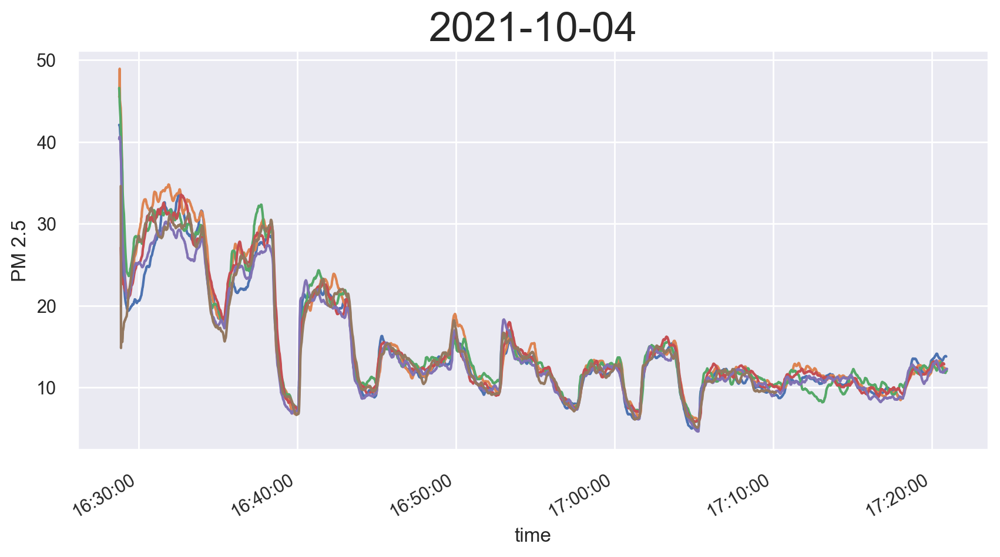

In [73]:
plot_sensors(date, sensor_dfs, labels, pt_df, (), '')